In [1]:
import sys

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import calendar
import time
import os
import warnings
import re
import networkx as nx
from tqdm import tqdm
import matplotlib.ticker as tk
from matplotlib.ticker import FormatStrFormatter
          
warnings.filterwarnings('ignore')

# from support_library.plot_support import *
pd.set_option('display.max_columns', None)

%matplotlib inline
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

In [2]:
# setting up the styling for the plots in this notebook
sns.set(style="white", 
        palette="colorblind", 
        font_scale=0.95, 
        rc={"figure.figsize":(15,12)})

In [3]:
def get_path(folder, file):
    return os.path.join(folder, file)

In [4]:
folder='csv'

### fetching tasks datamart

In [13]:
dict_files=\
dict(zip(
    ['all_tasks_trg_new_equaring_src_cnt',
     'all_tasks_trg_new_kredit_src_cnt',
     'all_tasks_trg_new_lising_src_cnt',
     'all_tasks_trg_new_zarplatnyi_src_cnt'], 
    ['ЭКВАЙРИНГ',
     'КРЕДИТОВАНИЕ',
     'ЛИЗИНГ',
     'ЗАРПЛАТНЫЕ ПРОЕКТЫ']))

In [17]:
trg_df = pd.read_csv(get_path(folder, list(dict_files.keys())[0])+'.csv', sep=';')
trg_df.columns=trg_df.columns.map(lambda x: x.lower())
trg_df['ratio']=trg_df['trg_impact_cnt']/trg_df['sum_src']*100
trg_df.head(30)

,trgrange,src_det,trg_impact_cnt,sum_src,ratio
0,1,T011,1008,79837,1.262572
1,1,T012,1078,79837,1.350251
2,1,T050,1757,79837,2.200734
3,1,T054,15405,79837,19.295565
4,1,T076,1659,79837,2.077984
5,1,T093,24528,79837,30.722597
6,1,T095,8125,79837,10.176986
7,1,T136,14292,79837,17.901474
8,1,T137,5,79837,0.006263
9,1,T138,2553,79837,3.197765


In [24]:
trg_df_t=trg_df.copy()

In [18]:
trg_dict=trg_df['src_det'].reset_index().set_index('src_det').to_dict(orient='dict')

In [21]:
for key in trg_dict['index'].keys():
    #trg_dict['index'][key]=cmap(np.random.randint(20,cmap.N))
    trg_dict['index'][key]='#'+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)])
trg_dict

{'index': {'T011': '#10007F',
  'T012': '#B04878',
  'T050': '#A05146',
  'T054': '#FC95DF',
  'T076': '#37911E',
  'T093': '#CE7FD5',
  'T095': '#6693D7',
  'T136': '#642315',
  'T137': '#2596F2',
  'T138': '#6E1AEE',
  'T146': '#26E580'}}

In [6]:
cmap=plt.cm.get_cmap('hsv_r')

In [22]:
cmap_arr=[]

for indx in trg_df.index:
    #np.random.seed(trg_dict['index'].get(trg_df.loc[indx,'src_det']))
    #cmap_arr.append(cmap(np.random.randint(20,cmap.N)))
    cmap_arr.append(trg_dict['index'].get(trg_df.loc[indx,'src_det']))
trg_df['colors']=cmap_arr

In [23]:
trg_df.trgrange.max()

6

In [32]:
prod_gr_name=list(dict_files.values())[0]
prod_gr_name

'ЭКВАЙРИНГ'

In [84]:
id_name='Задачи'

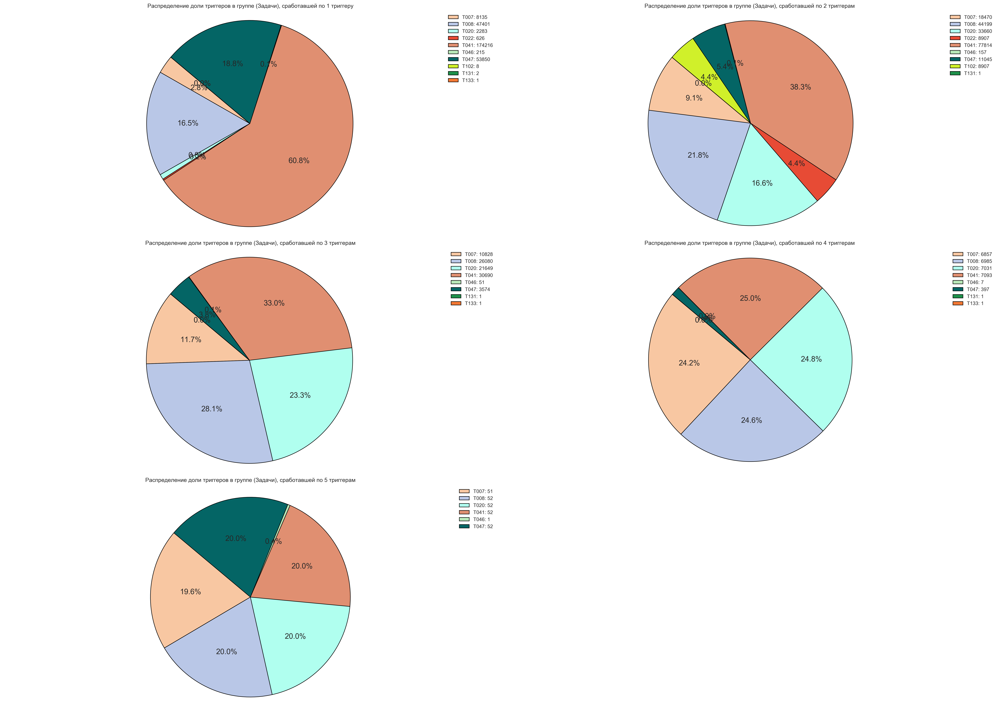

In [85]:
fig=plt.figure(figsize=(28,20),dpi=300)
# group of tasks with number of responded triggers equal to 1
ax1=plt.subplot2grid((3,2),(0,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==1),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==1),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==1),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==1),'trg_impact_cnt']], 
           loc='best', fontsize='medium') 
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 1 триггеру');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 2
ax1=plt.subplot2grid((3,2),(0,1))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==2),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==2),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==2),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==2),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 2 триггерам');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 3
ax1=plt.subplot2grid((3,2),(1,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==3),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==3),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==3),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==3),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 3 триггерам');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 4
ax1=plt.subplot2grid((3,2),(1,1))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==4),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==4),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==4),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==4),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 4 триггерам');
# group of tasks with number of responded triggers equal to 5
ax1=plt.subplot2grid((3,2),(2,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==5),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==5),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==5),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==5),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 5 триггерам');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 6
ax1=plt.subplot2grid((3,2),(2,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==6),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==6),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==6),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==6),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 6 триггерам');
plt.tight_layout()



fig.savefig(get_path('fig', 'pie_trg_ID_dist_'+id_name+'_'+prod_gr_name+'_.png'), 
            format='png', 
            dpi=300, 
            bbox_inches='tight',
            pad_inches=0.1) 



### fetching deals datamart

In [25]:
df = pd.read_csv(get_path(folder, 'all_camp_deals_trg_new.csv'), sep=';', encoding='utf8', compression='gzip')
df.columns=df.columns.map(lambda x: x.lower())
df.prod_gr_atb_seg=df.prod_gr_atb_seg.apply(lambda x: x.strip())
df.head()

,src_det,tr_id,src_detail,prod_gr_atb_seg,id,ckp_id,info,segment_client,priority_client,company_id,inn,date_create,date_close,status_result,product,amount,tb_vko,gosb_vko,rm_fio,vko_id,fio_vko,task_id,status_task,status_result_task,comment_txt_task,flag_deal,flag_deal_completed,amount_create,amount_complete,type_object,date_load,flag_ckr,date_close_task,executor_id,fio_executor,tb_executor,gosb_executor,osb_executor,vsp_executor,rm_id_executor,rm_fio_executor,flag_equal_product,product_id,flag_deal_holding,c,s
0,T047,47,"NBA,T047,OTR,OTR2",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-R31FJL1,ЦА-ЕДНБАЗММБ-0618,Заключение договора,Микро,Ключевой,1-EOBAWF,732800606272,2018-07-06,NaN,13.Закрыта/Отказ,Зарплатные проекты,50.0,Поволжский банк,Ульяновское ГОСБ №8588,Трегубова Наталья Анатольевна,1-1IPM2-15,Краснов Станислав Владимирович,1-QDL7JGF,Продукт не интересен,Нет потребности в наст.время,"Сказал подумает, ответ даст позже.договорились...",1,0,0.0,0.0,Deal,2018-12-11,0,2018-06-27,1-1IPM2-15,Краснов Станислав Владимирович,Поволжский банк,Ульяновское ГОСБ №8588,-,8588/2,1-69W4-54,Трегубова Наталья Анатольевна,1,1-1GW0,0,1.0,0.0
1,T047,47,"NBA,T047,OTR,OTR2",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-RBAG17E,ЦА-ЕДНБАЗММБ-0618,ЗПК,Микро,Ключевой,1-2GYZFTQ,231707900725,2018-07-11,NaN,12.Закрыта/Заключена,Зарплатные проекты,10.0,Юго-Западный банк,Краснодарское ГОСБ №8619,Сергейчик Александра Сергеевна,1-1L4XQ-53,Григорян Ерануи Лерниковна,1-QDLFY0T,Создана сделка,Истёк срок действия,NaN,1,1,0.0,0.0,Deal,2018-12-11,0,2018-07-12,1-1L4XQ-53,Григорян Ерануи Лерниковна,Юго-Западный банк,Краснодарское ГОСБ №8619,-,8619/14,1-NPN0R5W,Сергейчик Александра Сергеевна,1,1-1GW0,0,1.0,0.0
2,T047,47,"OTR2,NBA,T041,T047",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-SMTD3XU,ЦА-ЕДНБАЗММБЦКР-0718,ЗПП/ЛАЙТКАБ/03250006025,Малые,ЦКР,1-EMEJHG,32500060258,2018-08-23,NaN,12.Закрыта/Заключена,Зарплатные проекты,100.0,Байкальский банк,Бурятское ГОСБ №8601,Сагайдак Юлия Ярославна,1-GCRM-35,Асеева Виктория Евгеньевна,1-R1IC47I,Продукт не интересен,Нет потребности в наст.время,"""""""Нет потребности в настоящее время; """"""",1,1,0.0,0.0,Deal,2018-12-11,1,2018-09-03,1-LS2735M,Баканова Кристина Евгеньевна,Центральный аппарат,Региональный центр Тольятти,NaN,NaN,NaN,NaN,1,1-1GW0,0,1.0,0.0
3,T047,47,"OTR,NBA,T047",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-OMSVVWN,ЦА-ЕДНБАЗММБ-0418,ЗПК,Микро,Ключевой,1-E6O9FV,360500137994,2018-04-11,NaN,04.Формирование предложения,Зарплатные проекты,0.0,Центрально-Черноземный банк,ГО по Воронежской области,Герасимов Алексей Владимирович,1-IW8BNJM,Николашина Витория Алексеевна,1-OJRJY37,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11,0,2018-04-11,1-IW8BNJM,Николашина Витория Алексеевна,Центрально-Черноземный банк,ГО по Воронежской области,-,9013/11,1-PO-43,Герасимов Алексей Владимирович,1,1-1GW0,0,1.0,0.0
4,T047,47,"NBA,T020,T041,T047",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-OWFLZDH,ЦА-ЕДНБАЗММБ-0418,зп,Микро,ЦКР,1-DBO0XE5,637701123560,2018-04-23,2018-05-21,12.Закрыта/Заключена,Зарплатные проекты,70.0,Поволжский банк,Самарское ГОСБ №6991,Чекмасова Ольга Александровна,1-1CJ36-33,Мишина Ольга Викторовна,1-OJRK6U1,Создана сделка,Истёк срок действия,"Согласен, первое зачисление в апреле",1,1,0.0,0.0,Deal,2018-12-11,0,2018-04-24,1-1CJ36-33,Мишина Ольга Викторовна,Поволжский банк,Самарское ГОСБ №6991,-,6991/6,1-FLMZ-52,Чекмасова Ольга Александровна,1,1-1GW0,0,1.0,0.0


In [26]:
df.prod_gr_atb_seg.value_counts()

ЗАРПЛАТНЫЕ ПРОЕКТЫ                 33733
КРЕДИТОВАНИЕ                        5753
ЛИЗИНГ                              2748
ЭКВАЙРИНГ                           1817
БИЗНЕС-КАРТА                        1429
ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ        1067
БАНКОВСКАЯ ГАРАНТИЯ                  603
СТРАХОВАНИЕ                          485
CASH MANAGEMENT                      200
ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ           199
ИНКАССАЦИЯ                           152
КОНВЕРСИОННЫЕ ОПЕРАЦИИ               113
КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА       74
ФАКТОРИНГ                             40
РКО                                   27
ВЕКСЕЛЯ                                3
ВАЛЮТНЫЙ КОНТРОЛЬ                      1
Name: prod_gr_atb_seg, dtype: int64

In [27]:
prod_gr_name='ЭКВАЙРИНГ'

In [28]:
new_df=df.loc[(df.prod_gr_atb_seg==prod_gr_name),['task_id','src_det']]
#new_df=df

In [29]:
new_df['trg_count'] = (new_df.groupby('task_id')
                                  .task_id
                                  .rank(pct=False,
                                        method='max', 
                                        ascending=True))
new_df['trg_count']=new_df['trg_count'].astype(int)
new_df.head()

,task_id,src_det,trg_count
13,1-PX6Z85J,T093,1
27,1-U10FZLK,T093,1
80,1-T8O5BV4,T093,1
84,1-T8O579U,T093,1
111,1-UH5KV2F,T093,1


In [30]:
trg_df=new_df.groupby(['trg_count','src_det'])['src_det'].count().to_frame()
trg_df.index.set_names(names='trgrange',level=0, inplace=True)
trg_df.rename(columns={'src_det':'trg_impact_cnt'},inplace=True)
trg_df.reset_index(inplace=True)

dict_trg_count=dict(trg_df.groupby(['trgrange']).trg_impact_cnt.sum())

trg_df['sum_src']=trg_df['trgrange'].map(dict_trg_count)
trg_df['ratio']=trg_df['trg_impact_cnt']/trg_df['sum_src']*100
#trg_df['id']='Сделки'
trg_df

,trgrange,src_det,trg_impact_cnt,sum_src,ratio
0,1,T011,19,1195,1.589958
1,1,T012,11,1195,0.920502
2,1,T050,14,1195,1.171548
3,1,T054,500,1195,41.841004
4,1,T076,25,1195,2.092050
5,1,T093,202,1195,16.903766
6,1,T095,122,1195,10.209205
7,1,T136,165,1195,13.807531
8,1,T137,1,1195,0.083682
9,1,T138,79,1195,6.610879


In [31]:
trg_df_d=trg_df.copy()

In [208]:
trg_dict=trg_df['src_det'].reset_index().set_index('src_det').to_dict(orient='dict')

In [58]:
for key in trg_dict['index'].keys():
    #trg_dict['index'][key]=cmap(np.random.randint(20,cmap.N))
    trg_dict['index'][key]='#'+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)])
trg_dict

{'index': {'T001': '#E707BF',
  'T002': '#4D200A',
  'T024': '#C79B68',
  'T033': '#BD5D6B',
  'T038': '#AE2D0F',
  'T060': '#5DBBAD',
  'T107': '#E3840B',
  'T108': '#CFFA8B',
  'T120': '#141C1E',
  'T147': '#0CB427'}}

In [174]:
cmap=plt.cm.get_cmap('hsv_r')

In [59]:
cmap_arr=[]

for indx in trg_df.index:
    #np.random.seed(trg_dict['index'].get(trg_df.loc[indx,'src_det']))
    #cmap_arr.append(cmap(np.random.randint(20,cmap.N)))
    cmap_arr.append(trg_dict['index'].get(trg_df.loc[indx,'src_det']))
trg_df['colors']=cmap_arr

In [221]:
trg_df.trgrange.max()

4

In [177]:
# setting up the styling for the plots in this notebook
sns.set(style="white", 
        palette="colorblind", 
        font_scale=0.95, 
        rc={"figure.figsize":(15,16)})

In [198]:
id_name='Сделки'

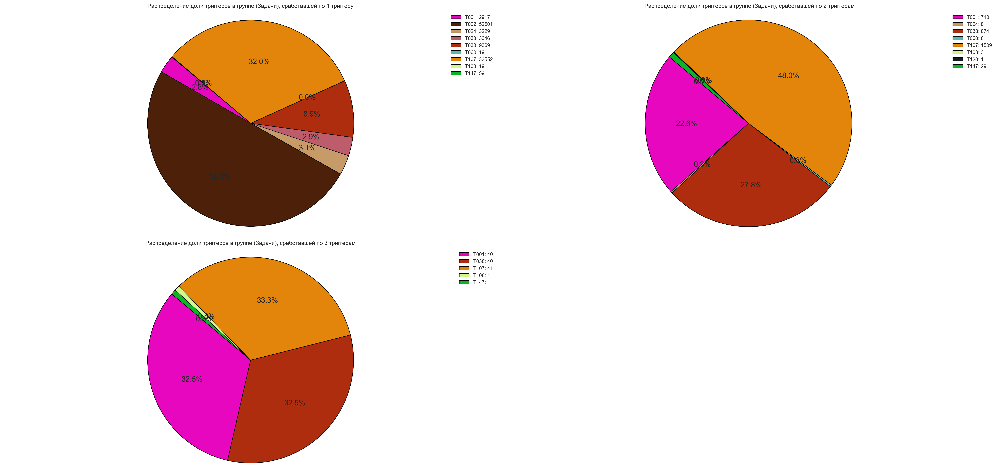

In [60]:
fig=plt.figure(figsize=(28,20),dpi=300)
# group of tasks with number of responded triggers equal to 1
ax1=plt.subplot2grid((3,2),(0,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==1),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==1),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==1),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==1),'trg_impact_cnt']], 
           loc='best', fontsize='medium') 
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 1 триггеру');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 2
ax1=plt.subplot2grid((3,2),(0,1))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==2),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==2),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==2),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==2),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 2 триггерам');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 3
ax1=plt.subplot2grid((3,2),(1,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==3),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==3),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==3),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==3),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 3 триггерам');
plt.tight_layout()
# group of tasks with number of responded triggers equal to 4
ax1=plt.subplot2grid((3,2),(1,1))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==4),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==4),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==4),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==4),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 4 триггерам');
# group of tasks with number of responded triggers equal to 5
ax1=plt.subplot2grid((3,2),(2,0))
patches =       plt.pie(trg_df.loc[(trg_df['trgrange']==5),'trg_impact_cnt'],
                        colors=trg_df.loc[(trg_df['trgrange']==5),'colors'], 
                        shadow=False,
                        startangle=140,
                        autopct='%1.1f%%',
                        wedgeprops={'linewidth':1,
                                    'edgecolor':'k', 
                                    'linestyle':'solid', 
                                    'antialiased':True},
                        textprops={'fontsize':15}
                        )
plt.legend(patches[0], 
           trg_df.loc[(trg_df['trgrange']==5),'src_det']+': '+
           ['{0:.0f}'.format(item) for item in trg_df.loc[(trg_df['trgrange']==5),'trg_impact_cnt']], 
           loc='best', fontsize='medium')
plt.axis('equal')
plt.title('Распределение доли триггеров в группе ('+id_name+'), сработавшей по 5 триггерам');
plt.tight_layout()




fig.savefig(get_path('fig', 'pie_trg_ID_dist_'+id_name+'_'+prod_gr_name+'_.png'), 
            format='png', 
            dpi=300, 
            bbox_inches='tight',
            pad_inches=0.1) 



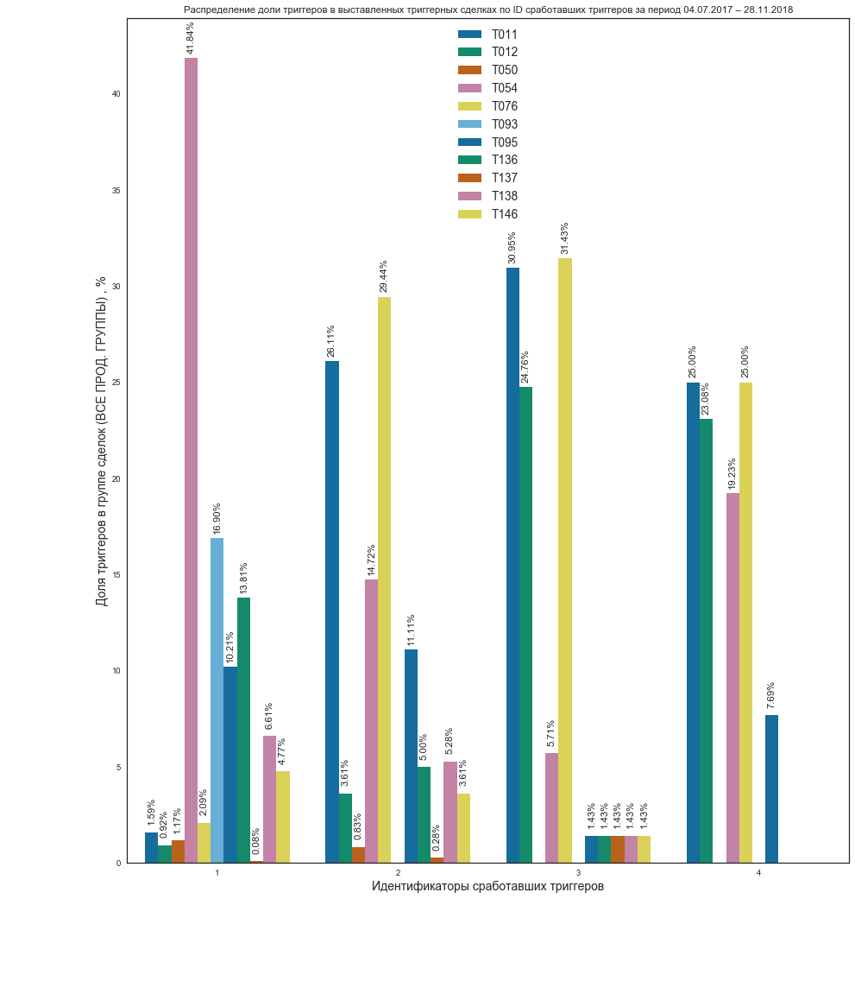

In [189]:
fig=plt.figure()
ax=sns.barplot(x='trgrange', 
               y='ratio',
               data=df,
               hue='src_det',
               palette=sns.color_palette('colorblind',35))
for p in ax.patches:
    ax.annotate('%.2f%%' %np.round(p.get_height(), decimals=3), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                va='center', xytext=(0, 25), rotation=90, textcoords='offset points')
ax.set_xlabel('Идентификаторы сработавших триггеров', fontsize=14)
ax.set_ylabel('Доля триггеров в группе сделок (' + prod_gr_name+') , %', fontsize=14)
plt.legend(loc='best', fontsize='large')
plt.title('Распределение доли триггеров в выставленных триггерных сделках по ID сработавших триггеров за период 04.07.2017 – 28.11.2018');
plt.show() 
#fig.savefig(get_path('fig', 'dist_ID_deals_vs_trg_'+prod_gr_name+'_.png'), 
#            format='png', 
#            dpi=400, 
#            bbox_inches='tight',
#            pad_inches=0.1)    

## Working with task datamart

In [5]:
df_t = pd.read_csv(get_path(folder, 'atb_segmen_trg_ext.csv'), sep=';', encoding='utf8', compression='gzip')
df_t.columns=df_t.columns.map(lambda x: x.lower())
df_t.loc[:,'create_date'] = pd.to_datetime(df_t['create_date'], format='%Y-%m-%d')
df_t['create_date'] = df_t['create_date'].values.astype('datetime64[D]')
df_t=df_t[(df_t['create_date']>pd.to_datetime('31.12.2017', format='%d.%m.%Y'))]
df_t.sort_values(by=['create_date'], ascending=True, inplace=True)
df_t.prod_gr_atb_seg=df_t.prod_gr_atb_seg.apply(lambda x: x.strip())
df_t.head(30)

,trg_pair_id,diff_days,list_trgs,src_det,tr_id,src_detail,prod_gr_atb_seg,prod,task_prpr_all,task_id,prpr_id,organization_id,inn,kpp,essence,cprod,prod_in_crm,prod_crm_id,pro_prior,status,close_date,create_date,close_date_plan,f_to_tasks,load_date_atb_tasks,last_refresh_date,last_refresh_type,result,result_comment,user_id,trg_number,prpr_date_status_kor,prpr_date_status,deal_id,sales_method,create_date_deal,close_date_fact,product,stage,deal_sum,deal_type,type,segment,full_description,status_client,cooperation,priority,holding_id,division,ter_div,func_div,vko,vko_id,main_executor_fio,segm_camp,is_deal,is_deal_close,task_create_correct,prpr_cancel,prpr_done,prpr_in_work,prpr_time_err,date_load,p_tasktrginn,part_num_p
97045,741,250,47,T047,47,"OTR,T047",ЗАРПЛАТНЫЕ ПРОЕКТЫ,Зарплатный проект,1-M5GVUPF,NaN,1-M5GVUPF,1-1215KMJ,621102875411,NaN,"Клиенту предложить : Зарплатный проект(OTR,T04...",ЦА-ЕДНБАЗММБ-0118,Зарплатные проекты,1-1GW0,1,07 Закрыта. Отказ клиента,2018-01-15 00:00:00,2018-01-09,2018-02-09 00:00:00,1,2018-12-15 00:00:00,NaN,NaN,Продукт не интересен,NaN,1-4OKY-2,47.0,2018-01-15 00:00:00,2018-01-15 11:19:01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ИП,Микро,ИВАНОВ МИХАИЛ ГЕННАДЬЕВИЧ,Закреплена,Активный клиент,Ключевой,1-FJNQJY0,Среднерусский банк,Рязанское отделение № 8606,Дополнительный офис № 8606/0169,Савицкий Алексей Иванович,1-4OKY-2,Савицкий Алексей Иванович,ММБ,0,0,2018-01-05 00:00:00,N,1.0,0.0,0.0,2018-12-17 00:00:00,1,1
740835,847,131,78,T078,78,T078,ЛИЗИНГ,Лизинг,1-M5H2G9B,NaN,1-M5H2G9B,1-KTXYQT,5506013451,NaN,Клиенту предложить : Лизинг(T078). Дет.инф. в ...,ЦА-ЕДНБАЗММБ-0118,Предзаявка в Сбербанк Лизинг,1-115HHZO,1,07 Закрыта. Отказ клиента,2018-02-01 00:00:00,2018-01-09,2018-02-09 00:00:00,1,2018-12-15 00:00:00,NaN,NaN,Продукт не интересен,NaN,1-J6K4K72,78.0,2018-01-16 00:00:00,2018-01-18 12:54:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Юр. лицо,Малые,ЛИАЛ,Закреплена,Активный клиент,Ключевой,NaN,Западно-Сибирский банк,Омское отделение № 8634,Сектор продаж клиентам малого бизнеса №8634/03,Гурова Ольга Викторовна,1-14DRL-18,Гурова Ольга Викторовна,ММБ,0,0,2018-01-05 00:00:00,N,1.0,0.0,0.0,2018-12-17 00:00:00,1,1
791231,658,97,35,T035,35,"OTR,T035",БАНКОВСКАЯ ГАРАНТИЯ,Банковская гарантия,1-M5GYAXC,NaN,1-M5GYAXC,1-D9SAQV9,1650308066,NaN,"Клиенту предложить : Банковская гарантия(OTR,T...",ЦА-ЕДНБАЗММБ-0118,Банковская гарантия,1-1GVO,1,07 Закрыта. Отказ клиента,2018-01-12 00:00:00,2018-01-09,2018-02-09 00:00:00,1,2018-12-15 00:00:00,NaN,NaN,Продукт не интересен,NaN,1-15AIB-46,35.0,2018-01-12 00:00:00,2018-01-12 13:02:57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Юр. лицо,Микро,ООО ПКФ Инструмент град,Закреплена,Активный клиент,Ключевой,NaN,Волго-Вятский банк,Банк Татарстан отделение №8610,Отдел продаж клиентам малого бизнеса 8610/05,Нургалиева Рания Шамсемухаметовна,1-1A6GL-18,Нургалиева Рания Шамсемухаметовна,ММБ,0,0,2018-01-05 00:00:00,N,1.0,0.0,0.0,2018-12-17 00:00:00,1,1
183385,847,145,78,T078,78,"NBA,T078",ЛИЗИНГ,Лизинг,1-M5GYQ43,NaN,1-M5GYQ43,1-2S4KN75,7805439026,NaN,"Клиенту предложить : Лизинг(NBA,T078). Дет.инф...",ЦА-ЕДНБАЗММБ-0118,Предзаявка в Сбербанк Лизинг,1-115HHZO,1,Отменена,2018-02-01 00:00:00,2018-01-09,2018-02-09 00:00:00,1,2018-12-15 00:00:00,NaN,NaN,Закрыто,Закрыта в результате автоматической отмены про...,1-I27MXLU,78.0,2018-01-12 00:00:00,2018-02-01 10:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Юр. лицо,Средние,РЭЙЛ СИСТЕМС,Закреплена,Не клиент,D,NaN,Северо-Западный банк,ГО по СПБ,Промышленность_КПК 5,Карасев Андрей Юрьевич,1-13P70-3,Карасев Андрей Юрьевич,ММБ,0,0,2018-01-05 00:00:00,N,1.0,0.0,0.0,2018-12-17 00:00:00,1,1
38039,35,83,"11, 12, 76",T076,76,"T011,T012,T076",ЭКВАЙРИНГ,Эквайринг,1-M5GTUBF,NaN,1-M5GTUBF,1-7XBHFBP,745300396477,NaN,Клиенту предложить : Эквайринг[Эквайринг в ВТБ...,ЦА-ЕДНБАЗММБ-0118,Эквайринг,1-1GUC,1,Отменена,2018-01-12 00:00:00,2018-01-09,2018-02-09 00:00:00,1,2018-12-15 00:00:00,NaN,NaN,Закрыто,Закрыта в результате автоматической отмены про...,1-ITI9-22,76.0,2018-01-12 00:00:00,2018-01-12 12:04:

In [6]:
lst_prod_grs=df_t.prod_gr_atb_seg.value_counts().index.tolist()
lst_prod_grs=[item for item in lst_prod_grs if 'ПОВТ' not in item]
lst_prod_grs

['ЗАРПЛАТНЫЕ ПРОЕКТЫ',
 'ЛИЗИНГ',
 'КРЕДИТОВАНИЕ',
 'ЭКВАЙРИНГ',
 'БАНКОВСКАЯ ГАРАНТИЯ',
 'БИЗНЕС-КАРТА',
 'СТРАХОВАНИЕ',
 'ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ',
 'ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ',
 'ИНКАССАЦИЯ',
 'КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА',
 'КОНВЕРСИОННЫЕ ОПЕРАЦИИ',
 'CASH MANAGEMENT',
 'ФАКТОРИНГ',
 'ВЕКСЕЛЯ',
 'ВАЛЮТНЫЙ КОНТРОЛЬ']

In [41]:
df_t.segment.value_counts()/len(df_t)*100

Микро             87.190270
Малые             12.218144
Рег. госсектор     0.295016
Средние            0.278506
Крупнейшие         0.008972
Крупные            0.005144
ОПК                0.003948
Name: segment, dtype: float64

## Working with deal datamart (convertation calculations)

In [7]:
df = pd.read_csv(get_path(folder, 'all_camp_deals_trg_ext.csv'), sep=';', encoding='utf8', compression='gzip')
df.columns=df.columns.map(lambda x: x.lower()) 
df.loc[:,'date_create'] = pd.to_datetime(df['date_create'], format='%Y-%m-%d')
df['date_create'] = df['date_create'].values.astype('datetime64[D]')
df=df[(df['date_create']>pd.to_datetime('31.12.2017', format='%d.%m.%Y'))]
df.sort_values(by=['date_create'], ascending=True, inplace=True)
df.prod_gr_atb_seg=df.prod_gr_atb_seg.apply(lambda x: x.strip())
df.head(30)

,trg_pair_id,src_det,tr_id,src_detail,list_trgs,prod_gr_atb_seg,id,ckp_id,info,segment_client,priority_client,company_id,inn,min_date_load_trg,date_create,diff_days,date_close,status_result,product,amount,tb_vko,gosb_vko,rm_fio,vko_id,fio_vko,task_id,status_task,status_result_task,comment_txt_task,flag_deal,flag_deal_completed,amount_create,amount_complete,type_object,date_load,flag_ckr,date_close_task,executor_id,fio_executor,tb_executor,gosb_executor,osb_executor,vsp_executor,rm_id_executor,rm_fio_executor,flag_equal_product,product_id,flag_deal_holding,c,s,part_num_p
11643,247,T008,8,"T008,T041","8, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M4UT3HQ,ЦА-ЕДНБАЗММБ-0118,ЗП,Малые,Ключевой,1-D7FHK,6335008796,2017-02-05 12:57:15,2018-01-09,337,2018-02-07 00:00:00,12.Закрыта/Заключена,Зарплатные проекты,300.0,Поволжский банк,Самарское ГОСБ №6991,Чекмасова Ольга Александровна,1-54ZA-39,Юматова Светлана Сергеевна,1-M5GWPBR,Создана сделка,NaN,NaN,1,1,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-54ZA-39,Юматова Светлана Сергеевна,Поволжский банк,Самарское ГОСБ №6991,-,6991/5,1-FLMZ-52,Чекмасова Ольга Александровна,1,1-1GW0,0,3.0,416530.00,1
9769,247,T041,41,"T008,T041","8, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M4UT3HQ,ЦА-ЕДНБАЗММБ-0118,ЗП,Малые,Ключевой,1-D7FHK,6335008796,2017-04-17 00:00:00,2018-01-09,267,2018-02-07 00:00:00,12.Закрыта/Заключена,Зарплатные проекты,300.0,Поволжский банк,Самарское ГОСБ №6991,Чекмасова Ольга Александровна,1-54ZA-39,Юматова Светлана Сергеевна,1-M5GWPBR,Создана сделка,NaN,NaN,1,1,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-54ZA-39,Юматова Светлана Сергеевна,Поволжский банк,Самарское ГОСБ №6991,-,6991/5,1-FLMZ-52,Чекмасова Ольга Александровна,1,1-1GW0,0,0.0,11077.91,1
21322,217,T008,8,"OTR,NBA,T007,T008,T041","7, 8, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M67XKUK,ЦА-ЕДНБАЗММБ-0118,Зарплатные проекты,Микро,Ключевой,1-AX593B,7826696472,2017-02-05 12:57:15,2018-01-10,338,NaN,13.Закрыта/Отказ,Зарплатные проекты,500.0,Северо-Западный банк,ГО по г. Санкт-Петербургу,Мещерякова Светлана Евгеньевна,1-OSKRRIG,Полосухин Андрей Анатольевич,1-M5G7RWQ,Продукт не интересен,Нет потребности в наст.время,Клиент в стадии принятия решения. Назначен пов...,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-02-06 00:00:00,1-1LKX7-4,Косинская Татьяна Валериевна,Северо-Западный банк,ГО по г. Санкт-Петербургу,-,9055/3,1-14WZY-45,Мещерякова Светлана Евгеньевна,1,1-1GW0,0,2.0,227940.00,1
26210,109,T025,25,"OTR,NBA,T025",25,ЛИЗИНГ,1-M6DEL06,ЦА-ЕДНБАЗММБ-0118,1 запрос на новый продукт и лимит,Микро,Ключевой,1-EREV7N,344100172830,2017-03-17 00:00:00,2018-01-10,299,NaN,09.Закрыта/Отказ,Предзаявка в Сбербанк Лизинг,25000.0,Поволжский банк,Волгоградское ГОСБ №8621,Гончарук Инна Сергеевна,1-GWUM-22,Клопова Валерия Сергеевна,1-M5H2GJ6,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-H5QTYAC,Корниенко Артём Русланович,Поволжский банк,Волгоградское ГОСБ №8621,-,8621/2,1-DBFR-79,NaN,1,1-115HHZO,0,1.0,253473.69,1
44854,215,T041,41,"OTR,MPR01,T007,T008,T020,T041","7, 8, 20, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M6F88E9,ЦА-ЕДНБАЗММБ-0118,зпп,Микро,Ключевой,1-2GYUYN4,5905283266,2017-04-17 00:00:00,2018-01-10,268,NaN,13.Закрыта/Отказ,Зарплатные проекты,2000.0,Волго-Вятский банк,Пермское ГОСБ №6984,Зорина Юлия Александровна,1-1DZXC-8,Глухих Татьяна Александровна,1-M5H2XD7,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-1DZXC-8,Глухих Татьяна Александровна,Волго-Вятский банк,Пермское ГОСБ №6984,-,6984/2,1-1BI-91,Зорина Юлия Александровна,1,1-1GW0,0,3.0,109611.00,1
21063,215,T007,7,"OTR,MPR01,T007,T008,T020,T041","7, 8, 20, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M6F88E9,ЦА-ЕДНБАЗММБ-0118,зпп,Микро,Ключевой,1-2GYUYN4,5905283266,2017-07-20 00:00:00,2018-01-10,174,NaN,13.Закрыта/Отказ,Зарплатные проекты,2000.0,Волго-Вятский банк,Пермское ГОСБ №6984,Зорина Юлия Александровна,1-1DZXC-8,Глухих Татьяна Александровна,1-M5H2XD7,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-1DZXC-8,Глухих Татьяна Александров

In [32]:
df.segment_client.value_counts()

Микро             40487
Малые              6519
Средние             199
Рег. госсектор       48
Крупные               6
Name: segment_client, dtype: int64

In [31]:
df.priority_client.value_counts()

Ключевой    29709
ЦКР         15475
Нет          1811
D             108
C2             16
D2             13
C1              7
B               6
D1              2
Name: priority_client, dtype: int64

In [11]:
df.loc[( (df.amount_complete>0) | (df.flag_deal_completed>0) ), df.columns.isin(['src_det','tr_id','prod_gr_atb_seg'])]

,src_det,tr_id,prod_gr_atb_seg
11643,T008,8,ЗАРПЛАТНЫЕ ПРОЕКТЫ
9769,T041,41,ЗАРПЛАТНЫЕ ПРОЕКТЫ
26662,T017,17,ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ
20759,T099,99,БИЗНЕС-КАРТА
44253,T020,20,ЗАРПЛАТНЫЕ ПРОЕКТЫ
33888,T008,8,ЗАРПЛАТНЫЕ ПРОЕКТЫ
28741,T020,20,ЗАРПЛАТНЫЕ ПРОЕКТЫ
28176,T041,41,ЗАРПЛАТНЫЕ ПРОЕКТЫ
4002,T009,9,ИНКАССАЦИЯ
33887,T007,7,ЗАРПЛАТНЫЕ ПРОЕКТЫ


In [48]:
df.groupby(['task_id'])['task_id'].count().to_frame().rename(columns={'task_id':'task_id_cnt'}).reset_index()

,task_id,task_id_cnt
0,1-HRJHL1J,1
1,1-HRJHL2K,1
2,1-HRJHL5Y,1
3,1-HRJHL84,1
4,1-HRJIJSG,1
5,1-HRJJ6HR,1
6,1-HRJJ74D,1
7,1-HRJJN16,1
8,1-HRJJN7U,1
9,1-HRJKBWE,1


In [8]:
lst_prod_grs_d=df.prod_gr_atb_seg.value_counts().index.tolist()
lst_prod_grs_d

['ЗАРПЛАТНЫЕ ПРОЕКТЫ',
 'КРЕДИТОВАНИЕ',
 'ЛИЗИНГ',
 'ЭКВАЙРИНГ',
 'БИЗНЕС-КАРТА',
 'ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ',
 'БАНКОВСКАЯ ГАРАНТИЯ',
 'СТРАХОВАНИЕ',
 'ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ',
 'ИНКАССАЦИЯ',
 'КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА',
 'КОНВЕРСИОННЫЕ ОПЕРАЦИИ',
 'ВЕКСЕЛЯ',
 'ВАЛЮТНЫЙ КОНТРОЛЬ',
 'CASH MANAGEMENT']

### Map ID of trgs combinations from task set to deals set

In [9]:
dict_trg_comb_to_id_t=df_t[['trg_pair_id','list_trgs']].set_index('list_trgs').to_dict(orient='dict')

In [10]:
df.trg_pair_id=df.list_trgs.map(dict_trg_comb_to_id_t['trg_pair_id'])

In [11]:
df.head()

,trg_pair_id,src_det,tr_id,src_detail,list_trgs,prod_gr_atb_seg,id,ckp_id,info,segment_client,priority_client,company_id,inn,min_date_load_trg,date_create,diff_days,date_close,status_result,product,amount,tb_vko,gosb_vko,rm_fio,vko_id,fio_vko,task_id,status_task,status_result_task,comment_txt_task,flag_deal,flag_deal_completed,amount_create,amount_complete,type_object,date_load,flag_ckr,date_close_task,executor_id,fio_executor,tb_executor,gosb_executor,osb_executor,vsp_executor,rm_id_executor,rm_fio_executor,flag_equal_product,product_id,flag_deal_holding,c,s,part_num_p
11643,945,T008,8,"T008,T041","8, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M4UT3HQ,ЦА-ЕДНБАЗММБ-0118,ЗП,Малые,Ключевой,1-D7FHK,6335008796,2017-02-05 12:57:15,2018-01-09,337,2018-02-07 00:00:00,12.Закрыта/Заключена,Зарплатные проекты,300.0,Поволжский банк,Самарское ГОСБ №6991,Чекмасова Ольга Александровна,1-54ZA-39,Юматова Светлана Сергеевна,1-M5GWPBR,Создана сделка,NaN,NaN,1,1,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-54ZA-39,Юматова Светлана Сергеевна,Поволжский банк,Самарское ГОСБ №6991,-,6991/5,1-FLMZ-52,Чекмасова Ольга Александровна,1,1-1GW0,0,3.0,416530.00,1
9769,945,T041,41,"T008,T041","8, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M4UT3HQ,ЦА-ЕДНБАЗММБ-0118,ЗП,Малые,Ключевой,1-D7FHK,6335008796,2017-04-17 00:00:00,2018-01-09,267,2018-02-07 00:00:00,12.Закрыта/Заключена,Зарплатные проекты,300.0,Поволжский банк,Самарское ГОСБ №6991,Чекмасова Ольга Александровна,1-54ZA-39,Юматова Светлана Сергеевна,1-M5GWPBR,Создана сделка,NaN,NaN,1,1,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-54ZA-39,Юматова Светлана Сергеевна,Поволжский банк,Самарское ГОСБ №6991,-,6991/5,1-FLMZ-52,Чекмасова Ольга Александровна,1,1-1GW0,0,0.0,11077.91,1
21322,838,T008,8,"OTR,NBA,T007,T008,T041","7, 8, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M67XKUK,ЦА-ЕДНБАЗММБ-0118,Зарплатные проекты,Микро,Ключевой,1-AX593B,7826696472,2017-02-05 12:57:15,2018-01-10,338,NaN,13.Закрыта/Отказ,Зарплатные проекты,500.0,Северо-Западный банк,ГО по г. Санкт-Петербургу,Мещерякова Светлана Евгеньевна,1-OSKRRIG,Полосухин Андрей Анатольевич,1-M5G7RWQ,Продукт не интересен,Нет потребности в наст.время,Клиент в стадии принятия решения. Назначен пов...,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-02-06 00:00:00,1-1LKX7-4,Косинская Татьяна Валериевна,Северо-Западный банк,ГО по г. Санкт-Петербургу,-,9055/3,1-14WZY-45,Мещерякова Светлана Евгеньевна,1,1-1GW0,0,2.0,227940.00,1
26210,374,T025,25,"OTR,NBA,T025",25,ЛИЗИНГ,1-M6DEL06,ЦА-ЕДНБАЗММБ-0118,1 запрос на новый продукт и лимит,Микро,Ключевой,1-EREV7N,344100172830,2017-03-17 00:00:00,2018-01-10,299,NaN,09.Закрыта/Отказ,Предзаявка в Сбербанк Лизинг,25000.0,Поволжский банк,Волгоградское ГОСБ №8621,Гончарук Инна Сергеевна,1-GWUM-22,Клопова Валерия Сергеевна,1-M5H2GJ6,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-H5QTYAC,Корниенко Артём Русланович,Поволжский банк,Волгоградское ГОСБ №8621,-,8621/2,1-DBFR-79,NaN,1,1-115HHZO,0,1.0,253473.69,1
44854,836,T041,41,"OTR,MPR01,T007,T008,T020,T041","7, 8, 20, 41",ЗАРПЛАТНЫЕ ПРОЕКТЫ,1-M6F88E9,ЦА-ЕДНБАЗММБ-0118,зпп,Микро,Ключевой,1-2GYUYN4,5905283266,2017-04-17 00:00:00,2018-01-10,268,NaN,13.Закрыта/Отказ,Зарплатные проекты,2000.0,Волго-Вятский банк,Пермское ГОСБ №6984,Зорина Юлия Александровна,1-1DZXC-8,Глухих Татьяна Александровна,1-M5H2XD7,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-1DZXC-8,Глухих Татьяна Александровна,Волго-Вятский банк,Пермское ГОСБ №6984,-,6984/2,1-1BI-91,Зорина Юлия Александровна,1,1-1GW0,0,3.0,109611.00,1


In [9]:
prod_gr_name=lst_prod_grs[0]
prod_gr_name

'ЗАРПЛАТНЫЕ ПРОЕКТЫ'

In [50]:
len_tot  = len(df), 
len_comp = len(df[( (df.amount_complete>0) | (df.flag_deal_completed>0) )])
len_prod = len(df[(df.prod_gr_atb_seg==prod_gr_name)])

In [51]:
len_tot, len_comp, len_prod

((47259,), 24665, 33307)

In [11]:
# completed deals
len(df[(df.prod_gr_atb_seg==prod_gr_name)]),  len(df[( (df.amount_complete>0) | (df.flag_deal_completed>0) ) & 
                 (df.prod_gr_atb_seg==prod_gr_name)])

(1798, 810)

In [12]:
# total convertation  
totConv=len(df[( (df.amount_complete>0) | (df.flag_deal_completed>0) ) & 
                 (df.prod_gr_atb_seg==prod_gr_name)])/len(df[df.prod_gr_atb_seg==prod_gr_name])*100
totConv

45.05005561735261

### Influence of trigger's force on the local convertation in groups with different number of responded triggers  

In [24]:
new_df=df[df['prod_gr_atb_seg']==prod_gr_name]

In [27]:
new_df['trg_count'] = (new_df.groupby('task_id')
                                  .task_id
                                  .rank(pct=False,
                                        method='max', 
                                        ascending=True))
new_df['trg_count']=new_df['trg_count'].astype(int)
new_df.head()

,trg_pair_id,src_det,tr_id,src_detail,list_trgs,prod_gr_atb_seg,id,ckp_id,info,segment_client,priority_client,company_id,inn,min_date_load_trg,date_create,diff_days,date_close,status_result,product,amount,tb_vko,gosb_vko,rm_fio,vko_id,fio_vko,task_id,status_task,status_result_task,comment_txt_task,flag_deal,flag_deal_completed,amount_create,amount_complete,type_object,date_load,flag_ckr,date_close_task,executor_id,fio_executor,tb_executor,gosb_executor,osb_executor,vsp_executor,rm_id_executor,rm_fio_executor,flag_equal_product,product_id,flag_deal_holding,c,s,part_num_p,trg_count
11927,193,T054,54,"MPR05,NBA,T054,L57168711",54,ЭКВАЙРИНГ,1-M6DSFJO,ЦА-ЕДНБАЗММБ-0118,Торговый эквайринг,Малые,Ключевой,1-DM4NKM,6121008559,2017-11-22 00:00:00,2018-01-10,49,NaN,07.Закрыта/Отказ,Эквайринг,50.0,Юго-Западный банк,Ростовское ГОСБ №5221,Теряева Марина Сергеевна,1-3W1-327,Афанасьева Елена Владимировна,1-M5GYAAT,Создана сделка,NaN,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-12 00:00:00,1-3W1-327,Афанасьева Елена Владимировна,Юго-Западный банк,Ростовское ГОСБ №5221,-,5221/6,1-12X-27,Теряева Марина Сергеевна,1,1-1GUC,0,10.0,515000.00,1,1
6445,260,T095,95,T095,95,ЭКВАЙРИНГ,1-MEVD63P,ЦА-ЕДНБАЗММБ-0118,заключение договора_Мерчант,Микро,ЦКР,1-UMFNXZ,3443074624,2017-11-16 00:00:00,2018-01-18,63,NaN,07.Закрыта/Отказ,Эквайринг,0.0,Поволжский банк,Волгоградское ГОСБ №8621,Гончарук Инна Сергеевна,1-CDP9-13,Поповичева Зарина Шухратовна,1-M5GVUG6,Продукт не интересен,Нет потребности в наст.время,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-01-16 00:00:00,1-GPG1N34,Буренко Максим Николаевич,Поволжский банк,Волгоградское ГОСБ №8621,-,8621/2,1-489-82,Горбачева Наталья Викторовна,1,1-1GUC,0,34.0,179439.61,1,1
13768,193,T054,54,"T054,L57168711",54,ЭКВАЙРИНГ,1-MG8MRAQ,ЦА-ЕДНБАЗММБ-0118,"Эквайринг_#861000003684#_Челябинская обл, Сосн...",Микро,Ключевой,1-2NLR9WZ,7460015390,2017-11-30 00:00:00,2018-01-19,50,2018-03-13 00:00:00,05.Закрыта/Заключена,Эквайринг,200.0,Уральский банк,Челябинское ГОСБ №8597,Бабкина Юлия Владимировна,1-RWEBEKK,Бахтеева Екатерина Александровна,1-MFHKJYF,Создана сделка,Истёк срок действия,NaN,1,1,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-09-21 00:00:00,1-JAOL9ZU,Югова Светлана Александровна,Уральский банк,Челябинское ГОСБ №8597,-,8597/6,1-HME4-37,Хафизова Юлия Рафисовна,1,1-1GUC,0,6.0,255300.00,1,1
21568,196,T054,54,"T054,T095","54, 95",ЭКВАЙРИНГ,1-MGB7J1T,ЦА-ЕДНБАЗММБ-0118,"Заключение договора, мерчант 551000008517",Микро,Ключевой,1-AWX9M9,780700681789,2017-11-22 00:00:00,2018-01-19,58,2018-03-13 00:00:00,05.Закрыта/Заключена,Эквайринг,500.0,Северо-Западный банк,ГО по г. Санкт-Петербургу,Лифанова Анна Сергеевна,1-SKCLCAK,Захарова Наталия Владимировна,1-MFHQADF,Создана сделка,NaN,NaN,1,1,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-02-06 00:00:00,1-1B82T-58,Гончарова Виктория Александровна,Северо-Западный банк,ГО по г. Санкт-Петербургу,-,9055/27,1-1KTCG-19,NaN,1,1-1GUC,0,6.0,144000.00,1,2
6483,260,T095,95,T095,95,ЭКВАЙРИНГ,1-MGF0MLI,ЦА-ЕДНБАЗММБ-0118,1-ТЭ Эквайринг,Малые,Ключевой,1-1ROXIOM,5603039920,2017-11-16 00:00:00,2018-01-19,64,NaN,07.Закрыта/Отказ,Эквайринг,3.0,Поволжский банк,Оренбургское ГОСБ №8623,Королькова Елена Сергеевна,1-18H0I-15,Максимова Ирина Маратовна,1-MFI0UM3,Продукт не интересен,Нет потребности в наст.время,NaN,1,0,0.0,0.0,Deal,2018-12-11 00:00:00,0,2018-02-27 00:00:00,1-GCFKIFO,Калинина Светлана Алексеевна,Поволжский банк,Оренбургское ГОСБ №8623,-,8623/4,1-6P5V-37,Королькова Елена Сергеевна,1,1-1GUC,0,8.0,41757.02,1,1


In [28]:
new_df.trg_count.max()

4

In [36]:
bins=1000
windowing_list_all=[]
thresholding_trgs=np.arange(np.int(new_df.trg_count.max()))
thresholding_s=np.linspace(new_df.s.min(),new_df.s.max(),bins)

for i in tqdm(np.arange(len(thresholding_trgs))):
    windowing_list=[]
    for j in np.arange(len(thresholding_s)):
        len_gr=len(new_df[(new_df.trg_count == thresholding_trgs[i]+1)])
        part_df=new_df[( (new_df.amount_complete>0) | (new_df.flag_deal_completed>0) ) & 
                       (new_df.trg_count == thresholding_trgs[i]+1) &
                       (new_df.s < thresholding_s[i] )]
        windowing_list.append((thresholding_s[j]+1,len(part_df)/len_gr*100.))
    windowing_list_all.append(windowing_list)

100%|████████████████████████████████████████████| 4/4 [00:19<00:00,  4.83s/it]


In [38]:
thresholding_trgs

array([0, 1, 2, 3])

In [39]:
convert_df=pd.DataFrame(data=windowing_list_all[1],columns=['thresholding','convertation'])
convert_df

,thresholding,convertation
0,1.000000e+00,16.666667
1,6.140817e+04,16.666667
2,1.228153e+05,16.666667
3,1.842225e+05,16.666667
4,2.456297e+05,16.666667
5,3.070368e+05,16.666667
6,3.684440e+05,16.666667
7,4.298512e+05,16.666667
8,4.912584e+05,16.666667
9,5.526655e+05,16.666667


In [40]:
cmap = plt.get_cmap('viridis')

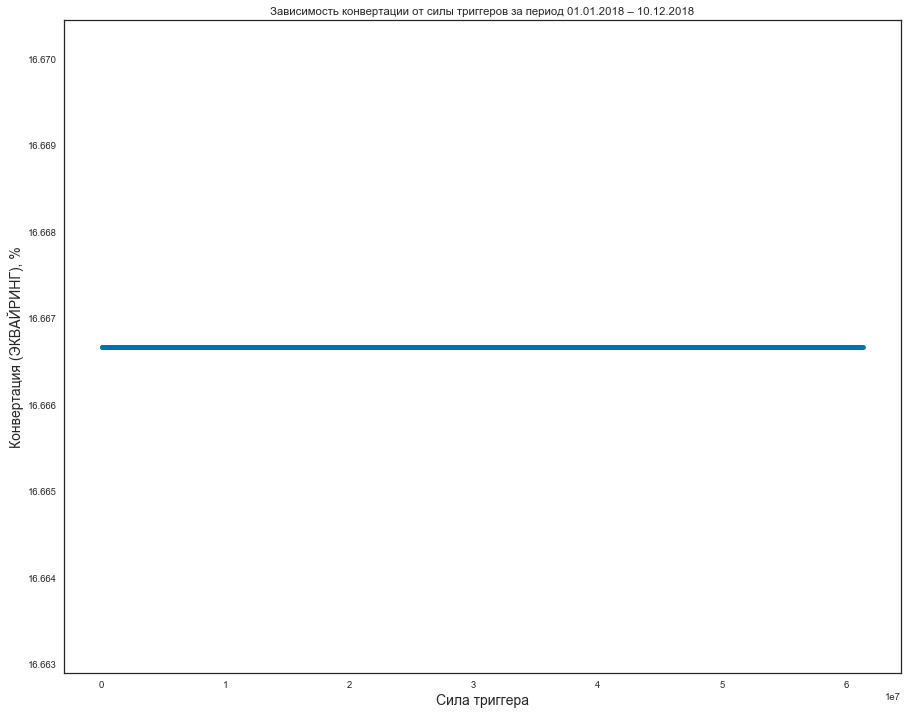

In [41]:
fig,ax=plt.subplots()
ax.scatter( x='thresholding', 
            y='convertation', 
            data=convert_df[convert_df.thresholding!=0], 
            s=20,
            cmap=cmap)
#ax.set_xlim(left=0., right=4.e10)
#ax.set_ylim(bottom=44.3, top=45)
ax.set_xlabel('Сила триггера', fontsize=14)
ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
plt.title('Зависимость конвертации от силы триггеров за период 01.01.2018 – 10.12.2018')

### calculate windowing converation depending on the trigger's force

In [123]:
bins=1000
windowing_list=[]
thresholding=np.linspace(0,df.s.max(),bins)

for i in tqdm(np.arange(len(thresholding))):
    part_df=df[( (df.amount_complete>0) | (df.flag_deal_completed>0) ) & 
                 (df.prod_gr_atb_seg==prod_gr_name) & 
                 (df.s < thresholding[i] )]
    windowing_list.append((thresholding[i],len(part_df)/len_prod*100))

100%|██████████████████████████████████████| 1000/1000 [00:12<00:00, 81.88it/s]


In [124]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])

In [125]:
convert_df.head(10)

,thresholding,convertation
0,0.000000e+00,0.000000
1,4.666108e+08,44.909191
2,9.332216e+08,44.909191
3,1.399832e+09,44.909191
4,1.866443e+09,44.909191
5,2.333054e+09,44.909191
6,2.799665e+09,44.909191
7,3.266276e+09,44.909191
8,3.732887e+09,44.909191
9,4.199497e+09,44.909191


In [126]:
convert_df.corr()

,thresholding,convertation
thresholding,1.000000,0.054745
convertation,0.054745,1.000000


In [76]:
cmap = plt.get_cmap('viridis')

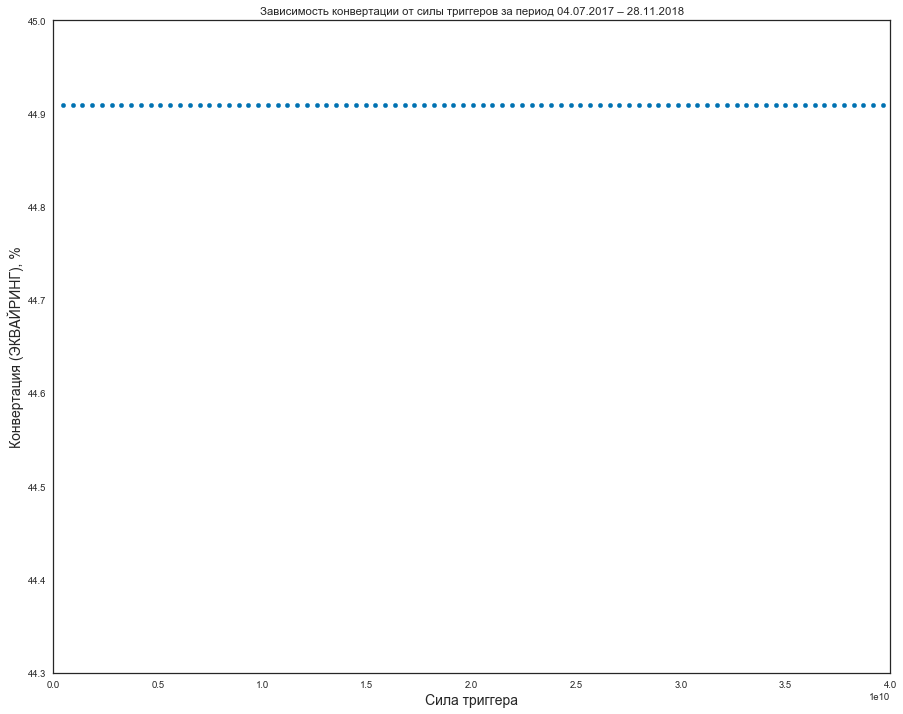

In [129]:
fig,ax=plt.subplots()
ax.scatter( x='thresholding', 
            y='convertation', 
            data=convert_df[convert_df.thresholding!=0], 
            s=20,
            cmap=cmap)
ax.set_xlim(left=0., right=4.e10)
ax.set_ylim(bottom=44.3, top=45)
ax.set_xlabel('Сила триггера', fontsize=14)
ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
plt.title('Зависимость конвертации от силы триггеров за период 10.12.2018 – 28.11.2018')

fig.savefig(get_path('fig', 'conv_vs_trg_force_'+prod_gr_name.lower()+'_.png'), 
            format='png', 
            dpi=500, 
            bbox_inches='tight',
            pad_inches=0.1)

# TRIGGRER'S COMBINATIONS + TRIGGERING AMOUNT

### Calculate local convertation depending on the pairs of responded triggers

In [72]:
lst_prod_grs, lst_prod_grs_d

(['ЗАРПЛАТНЫЕ ПРОЕКТЫ',
  'ЛИЗИНГ',
  'КРЕДИТОВАНИЕ',
  'ЭКВАЙРИНГ',
  'БАНКОВСКАЯ ГАРАНТИЯ',
  'БИЗНЕС-КАРТА',
  'СТРАХОВАНИЕ',
  'ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ',
  'ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ',
  'ИНКАССАЦИЯ',
  'КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА',
  'КОНВЕРСИОННЫЕ ОПЕРАЦИИ',
  'CASH MANAGEMENT',
  'ФАКТОРИНГ',
  'ВЕКСЕЛЯ',
  'ВАЛЮТНЫЙ КОНТРОЛЬ'],
 ['ЗАРПЛАТНЫЕ ПРОЕКТЫ',
  'КРЕДИТОВАНИЕ',
  'ЛИЗИНГ',
  'ЭКВАЙРИНГ',
  'БИЗНЕС-КАРТА',
  'ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ',
  'БАНКОВСКАЯ ГАРАНТИЯ',
  'СТРАХОВАНИЕ',
  'ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ',
  'ИНКАССАЦИЯ',
  'КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА',
  'КОНВЕРСИОННЫЕ ОПЕРАЦИИ',
  'ВЕКСЕЛЯ',
  'ВАЛЮТНЫЙ КОНТРОЛЬ',
  'CASH MANAGEMENT'])

## Automated convertation calculation with the following plotting 

In [75]:
from IPython.display import clear_output

### caclulate tasks distribution

In [106]:
for i in tqdm(range(len(lst_prod_grs))):

    prod_gr_name=lst_prod_grs[i]
    
    print('processing--> '+prod_gr_name)

    new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]

    dict_trg_pairs_t=new_df_t[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')
    
    windowing_list=[]
    thresholding=new_df_t.trg_pair_id.value_counts().index.tolist()

    for i in (np.arange(len(thresholding))):
        part_df=new_df_t[(new_df_t.trg_pair_id == thresholding[i] )]
        windowing_list.append((thresholding[i],len(part_df)))

    convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','total'])
    convert_df['list_trg']=convert_df.thresholding.map(dict_trg_pairs_t['list_trgs'])
    convert_df.sort_values(by=['total'],ascending=False, inplace=True)    

    if len(convert_df)!=0:
        fig=plt.figure(figsize=(17,16))
        ax=sns.barplot(x='list_trg', 
                       y='total',
                       data=convert_df[convert_df.total>np.round(convert_df.total.max()*0.001)])
        ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
        for p in ax.patches:
            if np.round(p.get_height(), decimals=2) > np.round(convert_df.total.max()*0.02):
                p.set_edgecolor('k')
                p.set_linewidth(3)
            ax.annotate('%.0f' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                        va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
            ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
            ax.set_ylabel('Количество выставленных задач ('+ prod_gr_name +')', fontsize=14)
            plt.title('Распределение выставленных задач в продуктовой группе от комбинаций сраб. триггеров')
            fig.savefig(get_path('fig', 't_total_count_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
                        format='png', 
                        dpi=400, 
                        bbox_inches='tight',
                        pad_inches=0.1)    
        
        clear_output()
        plt.close(fig)

100%|██████████| 16/16 [07:56<00:00,  8.66s/it]


### deals dist+converation normalized on corresponding tasks groups

In [105]:
bins=1000
for i in tqdm(range(len(lst_prod_grs))):

    prod_gr_name=lst_prod_grs[i]
    
    if prod_gr_name in lst_prod_grs_d:
    
        print('processing--> '+prod_gr_name)

        new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]
        new_df_d=df[df['prod_gr_atb_seg']==prod_gr_name]

        dict_trg_pairs_d=new_df_d[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')

        windowing_list=[]
        thresholding=new_df_d.trg_pair_id.value_counts().index.tolist()

        for i in (np.arange(len(thresholding))):
            len_gr=len(new_df_d[(new_df_d.trg_pair_id == thresholding[i] )])
            len_gr_t=len(new_df_t[(new_df_t.trg_pair_id == thresholding[i])])
            if (len_gr !=0):
                part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) &
                                 (new_df_d.trg_pair_id == thresholding[i])]
                windowing_list.append((thresholding[i],len_gr,len_gr_t,len(part_df)/len_gr_t*100.))  

        convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','total_d','total_t','convertation'])
        convert_df['list_trg']=convert_df.thresholding.map(dict_trg_pairs_d['list_trgs'])
        convert_df.sort_values(by=['total_d'],ascending=False, inplace=True)           

        if len(convert_df) != 0: 
            # plot deals distribution
            fig=plt.figure(figsize=(16,15))
            ax=sns.barplot(x='list_trg', 
                           y='total_d',
                           data=convert_df[convert_df.total_d>np.round(convert_df.total_d.max()*0.001)])
            ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
            for p in ax.patches:
                if np.round(p.get_height(), decimals=2) > np.round(convert_df.total_d.max()*0.02):
                    p.set_edgecolor('k')
                    p.set_linewidth(3)
                ax.annotate('%.0f' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                            va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
            ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
            ax.set_ylabel('Количество сделок ('+ prod_gr_name +')', fontsize=14)
            plt.title('Распределение заведенных сделок в продуктовой группе от комбинаций сраб. триггеров')
            fig.savefig(get_path('fig', 'd_total_count_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
                        format='png', 
                        dpi=400, 
                        bbox_inches='tight',
                        pad_inches=0.1)

            plt.close(fig)

            # plot deals convertation
            fig=plt.figure(figsize=(15,17))
            ax=sns.barplot(x='list_trg', 
                           y='convertation',
                           data=convert_df[convert_df.total_d>np.round(convert_df.total_d.max()*0.02)])
            ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
            for p in ax.patches:
                if np.round(p.get_height(), decimals=2) > 5.:
                    p.set_edgecolor('k')
                    p.set_linewidth(3)
                ax.annotate('%.1f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                            va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
            ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
            ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
            plt.title('Зависимость конвертации в продуктовой группе от комбинаций сраб. триггеров');
            #plt.legend(loc=9)

            fig.savefig(get_path('fig', 'd_conv_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
                        format='png', 
                        dpi=400, 
                        bbox_inches='tight',
                        pad_inches=0.1)        

        clear_output()
        plt.close(fig)

100%|██████████| 16/16 [01:31<00:00,  5.16s/it]


## Plot task+deals+successful deals

In [46]:
prod_gr_name=lst_prod_grs[0]
prod_gr_name

'ЗАРПЛАТНЫЕ ПРОЕКТЫ'

  0%|          | 0/16 [00:00<?, ?it/s]

processing--> ЗАРПЛАТНЫЕ ПРОЕКТЫ


  6%|▋         | 1/16 [00:04<01:02,  4.18s/it]

processing--> ЛИЗИНГ


 12%|█▎        | 2/16 [00:07<00:56,  4.06s/it]

processing--> КРЕДИТОВАНИЕ


 19%|█▉        | 3/16 [00:11<00:50,  3.87s/it]

processing--> ЭКВАЙРИНГ


 25%|██▌       | 4/16 [00:15<00:46,  3.85s/it]

processing--> БАНКОВСКАЯ ГАРАНТИЯ


 31%|███▏      | 5/16 [00:18<00:40,  3.69s/it]

processing--> БИЗНЕС-КАРТА


 38%|███▊      | 6/16 [00:21<00:36,  3.63s/it]

processing--> СТРАХОВАНИЕ


 44%|████▍     | 7/16 [00:25<00:31,  3.46s/it]

processing--> ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ


 50%|█████     | 8/16 [00:28<00:27,  3.40s/it]

processing--> ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ


 56%|█████▋    | 9/16 [00:31<00:22,  3.28s/it]

processing--> ИНКАССАЦИЯ


 62%|██████▎   | 10/16 [00:34<00:19,  3.17s/it]

processing--> КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА


 69%|██████▉   | 11/16 [00:37<00:15,  3.08s/it]

processing--> КОНВЕРСИОННЫЕ ОПЕРАЦИИ


 75%|███████▌  | 12/16 [00:40<00:12,  3.03s/it]

processing--> CASH MANAGEMENT


 81%|████████▏ | 13/16 [00:42<00:08,  3.00s/it]

processing--> ВЕКСЕЛЯ


 94%|█████████▍| 15/16 [00:45<00:02,  2.53s/it]

processing--> ВАЛЮТНЫЙ КОНТРОЛЬ


100%|██████████| 16/16 [00:48<00:00,  2.64s/it]


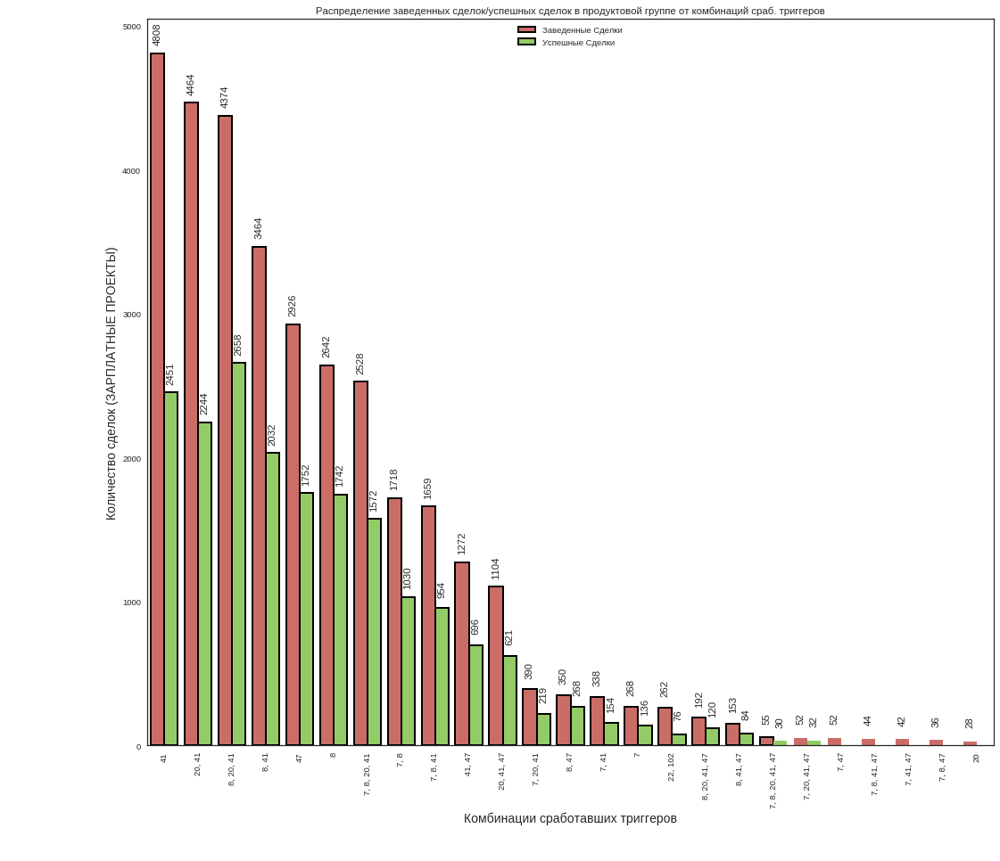

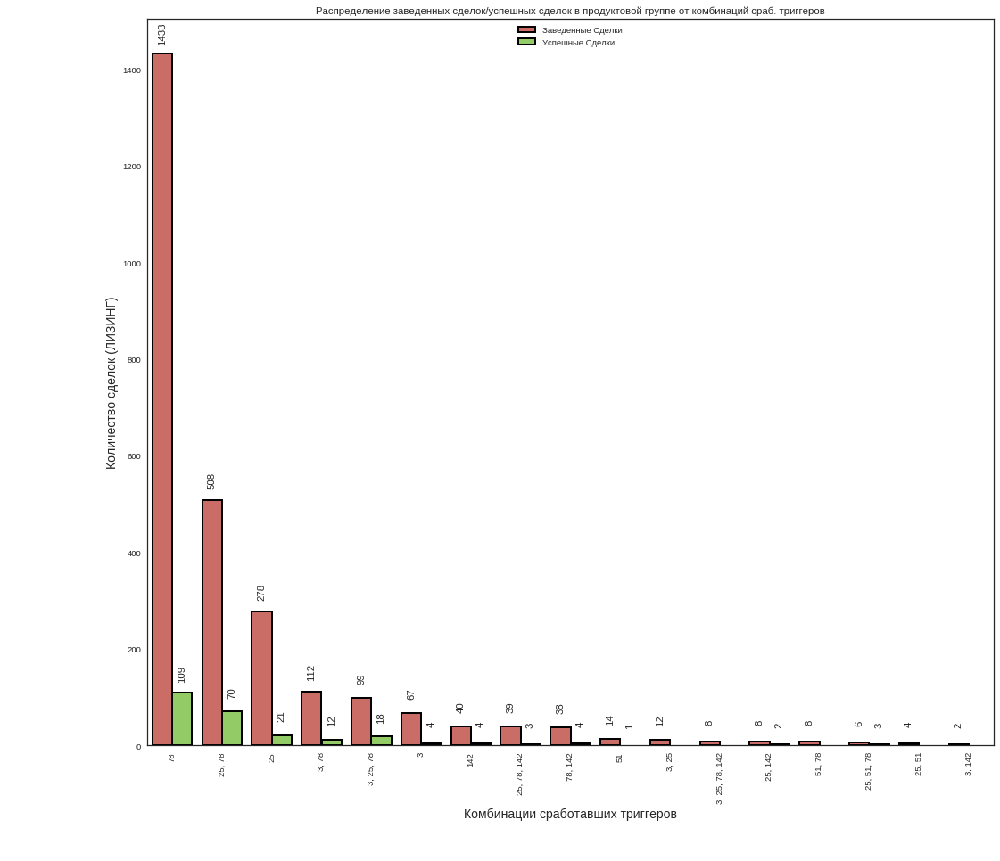

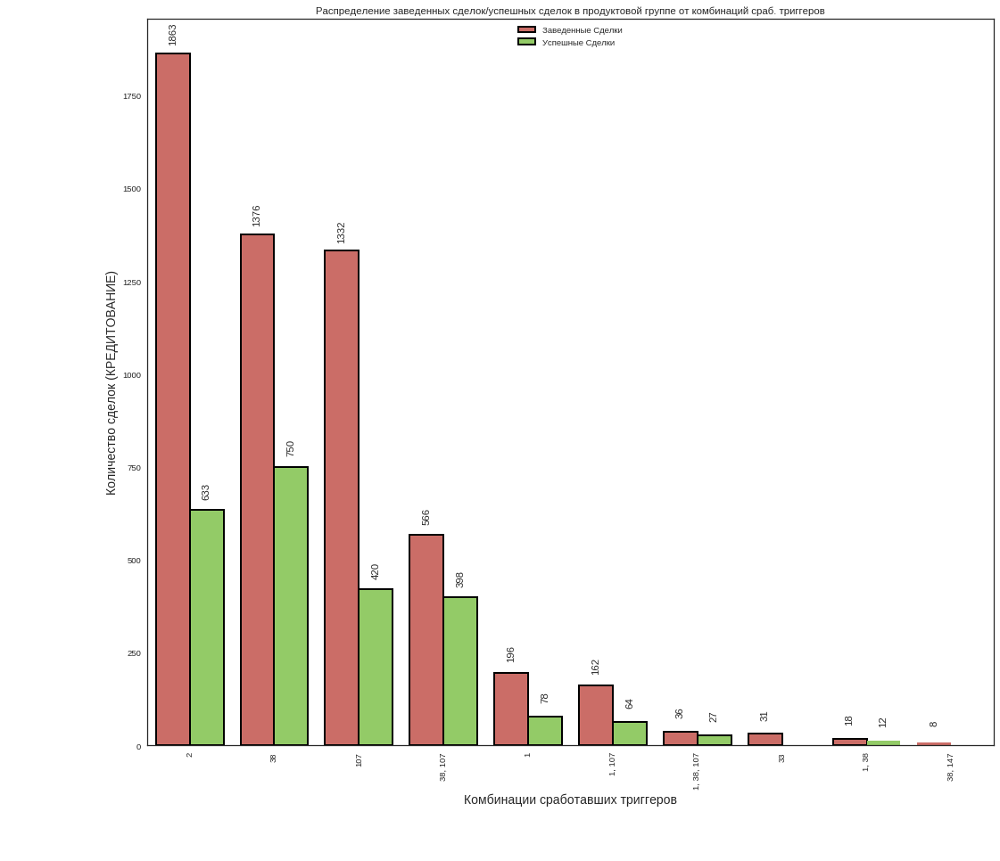

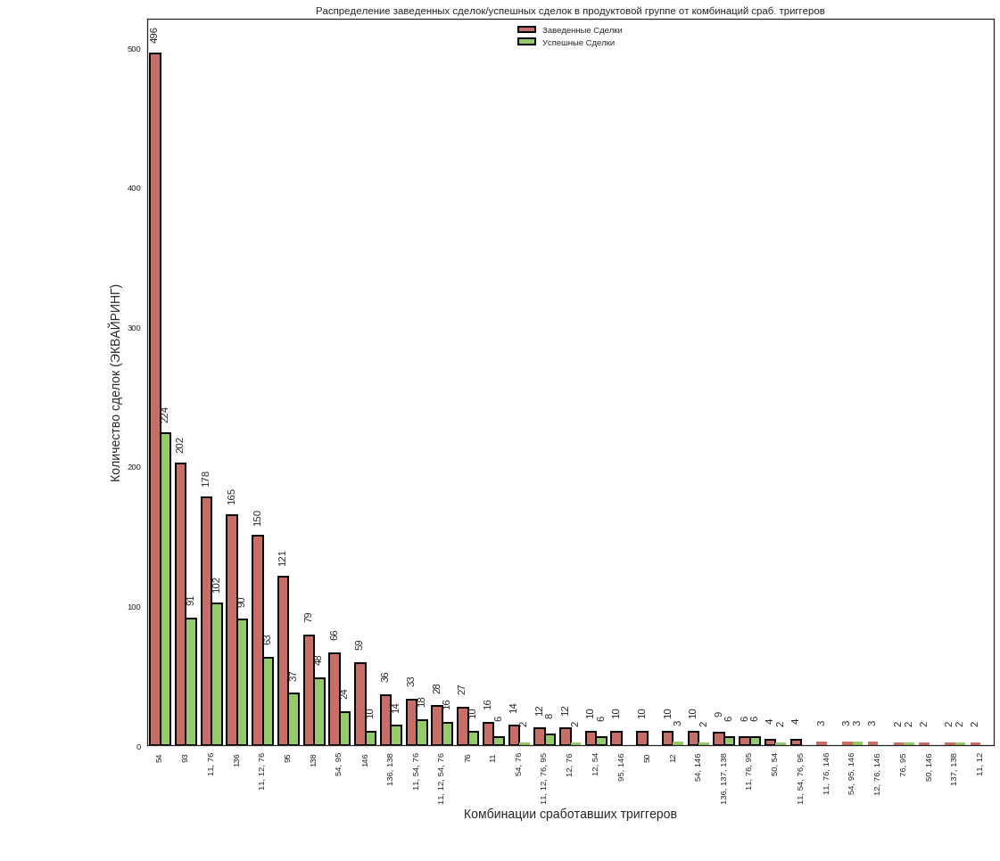

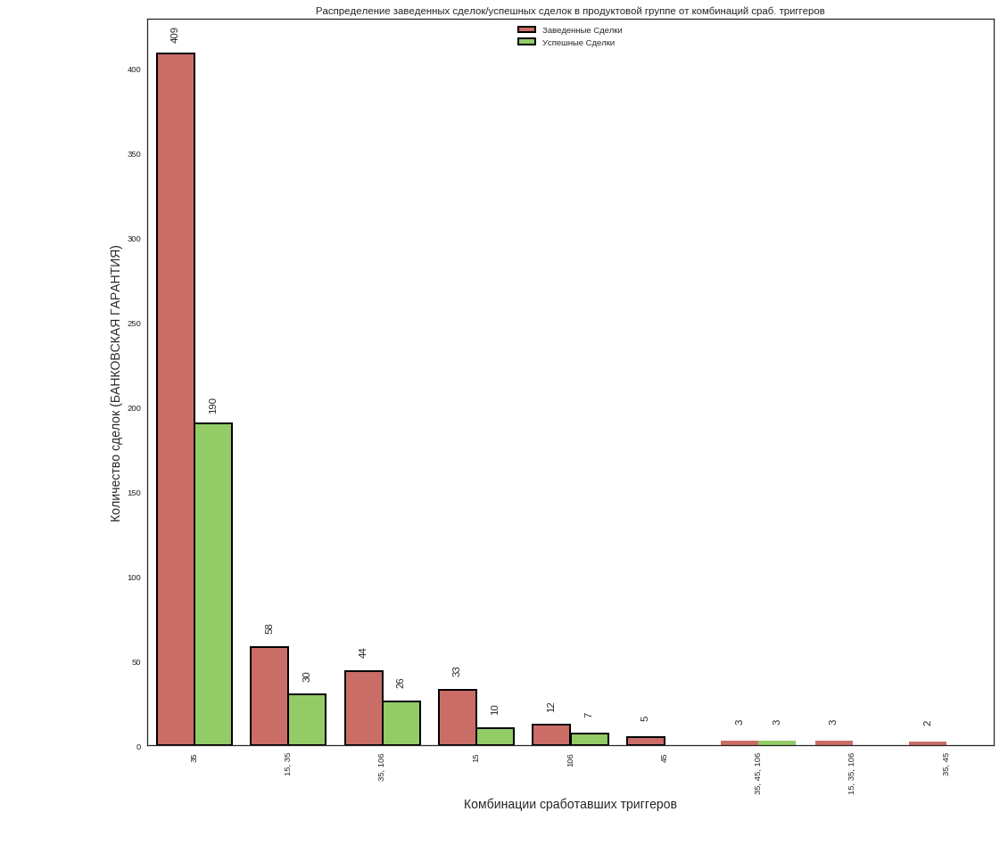

...

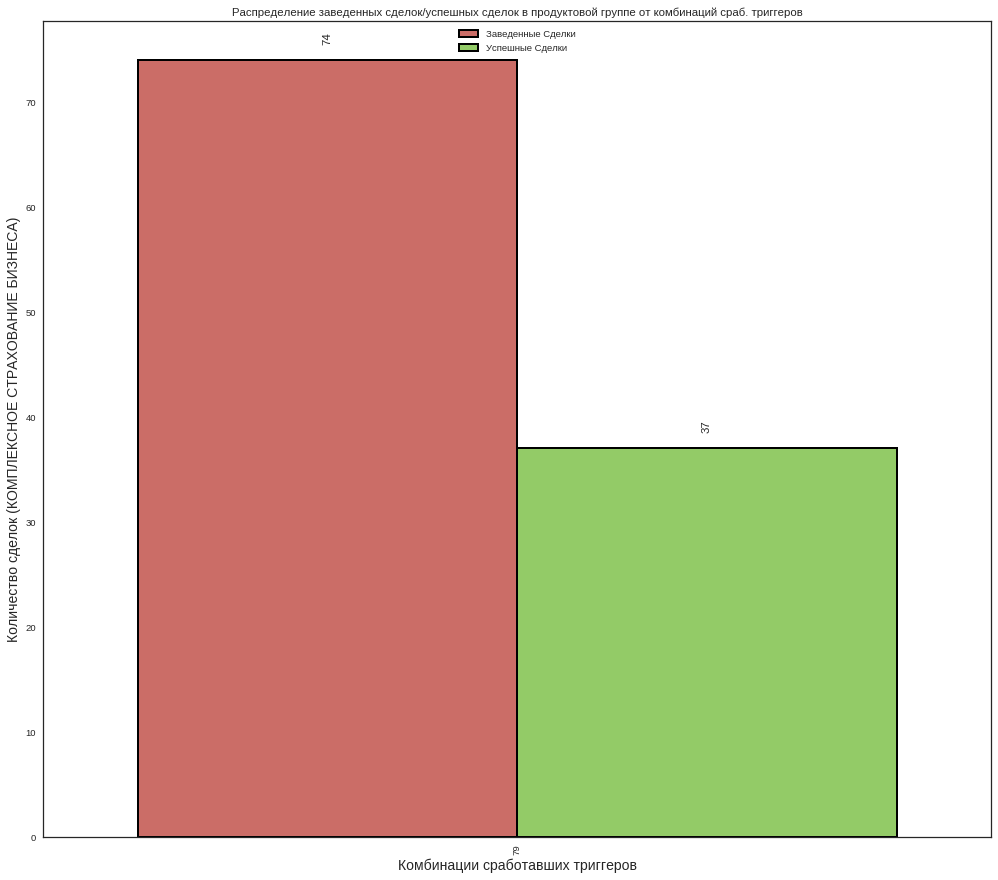

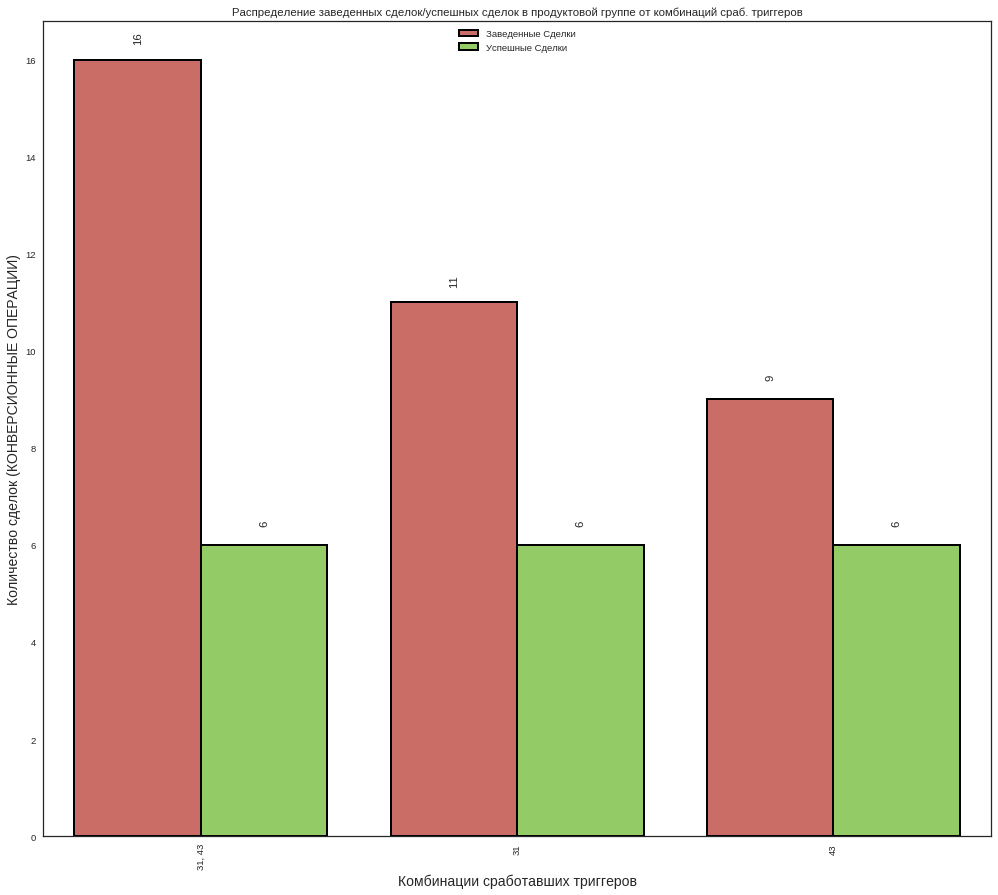

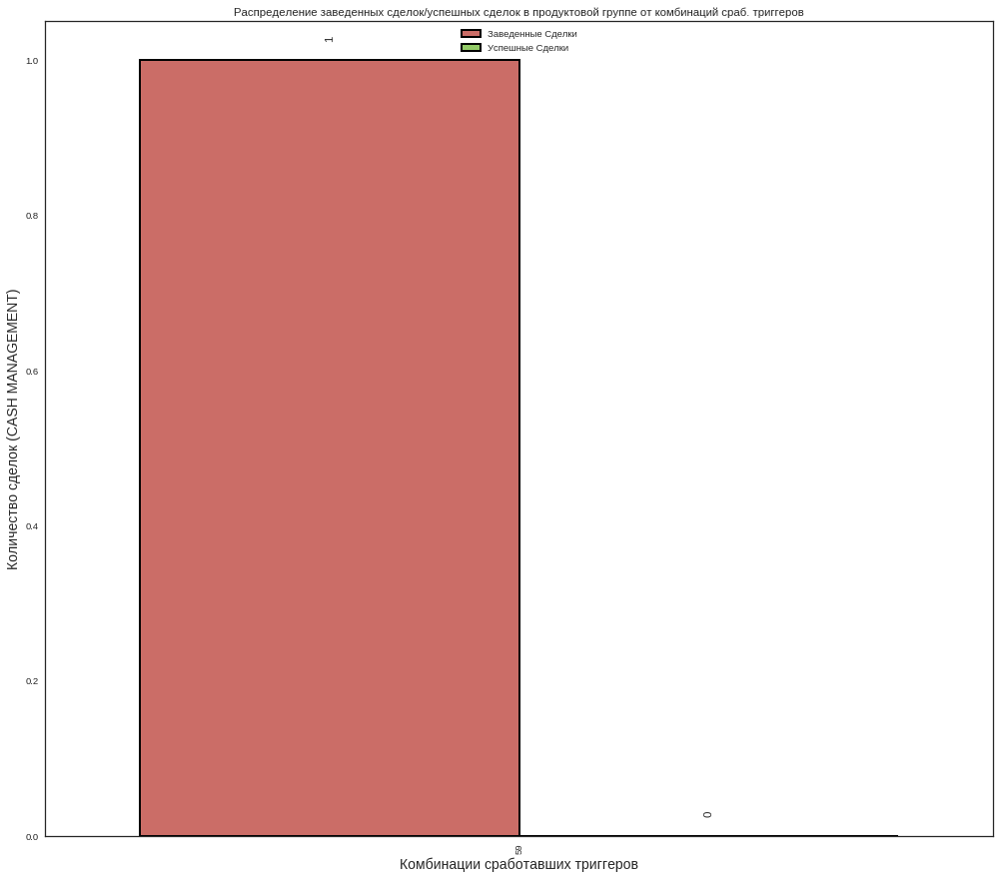

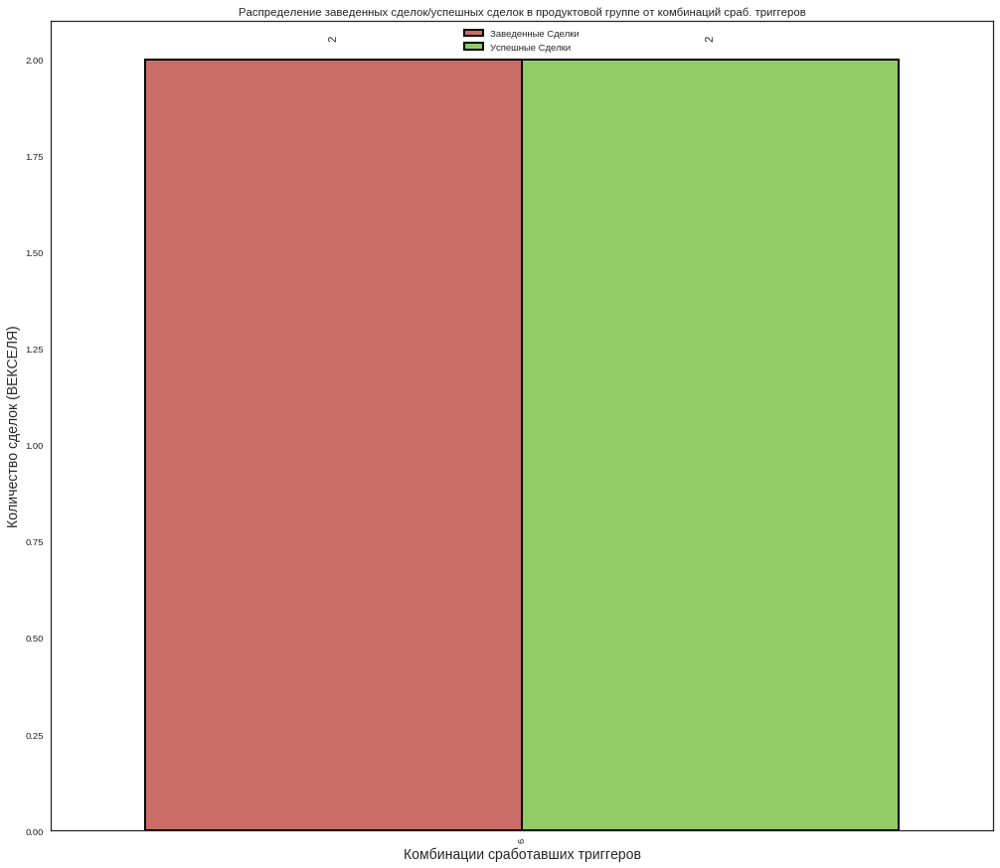

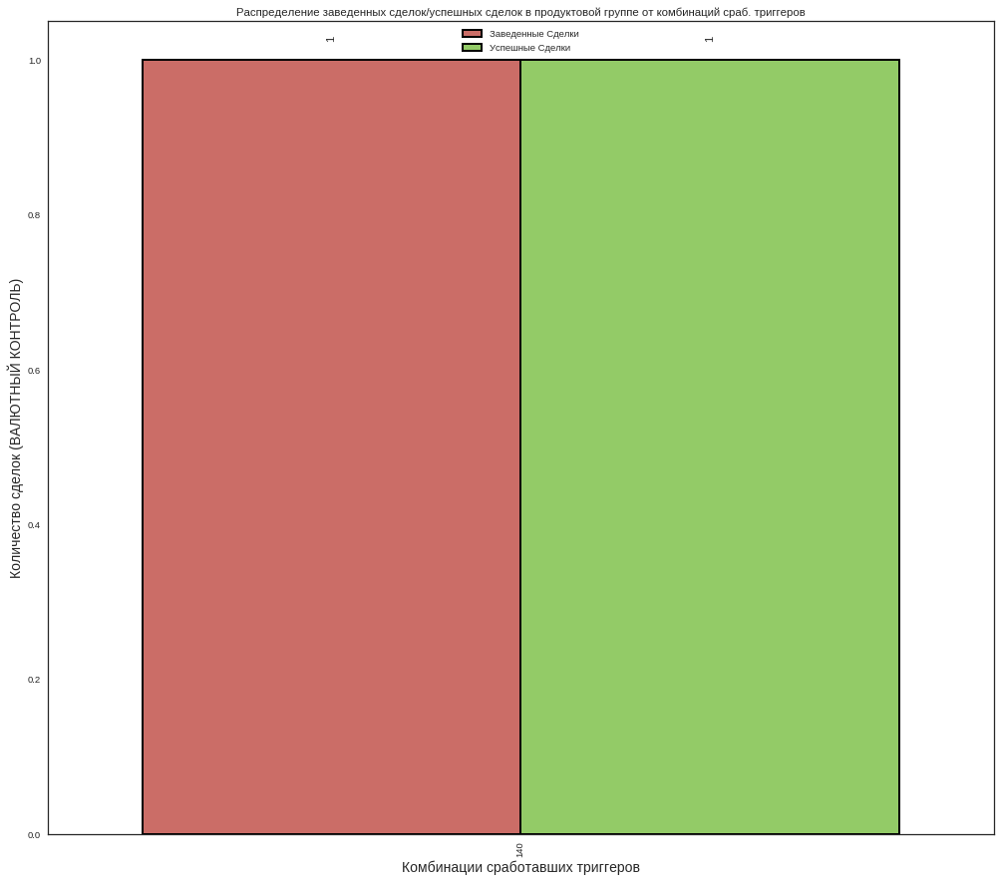

In [53]:
for i in tqdm(range(len(lst_prod_grs))):
    
    #if i>=lst_prod_grs.index('ВЕКСЕЛЯ'):
    
        prod_gr_name=lst_prod_grs[i]
        
        if prod_gr_name in lst_prod_grs_d:
            
            print('processing--> '+prod_gr_name)

            new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]
            new_df_d=df[df['prod_gr_atb_seg']==prod_gr_name]

            # tasks
            #dict_trg_pairs_t=new_df_t[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')
            #windowing_list=[]
            #thresholding=new_df_t.trg_pair_id.value_counts().index.tolist()

            #for i in (np.arange(len(thresholding))):
            #    part_df=new_df_t[(new_df_t.trg_pair_id == thresholding[i] )]
            #    windowing_list.append((thresholding[i],len(part_df)))

            #convert_df_t=pd.DataFrame(data=windowing_list,columns=['thresholding','total'])
            #convert_df_t['list_trg']=convert_df_t.thresholding.map(dict_trg_pairs_t['list_trgs'])
            #convert_df_t.sort_values(by=['total'],ascending=False, inplace=True)            
            #convert_df_t['id']='Задачи'

            # deals
            dict_trg_pairs_d=new_df_d[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')
            windowing_list=[]
            thresholding=new_df_d.trg_pair_id.value_counts().index.tolist()

            for i in (np.arange(len(thresholding))):
                len_gr=len(new_df_d[(new_df_d.trg_pair_id == thresholding[i] )])
                #len_gr_t=len(new_df_t[(new_df_t.trg_pair_id == thresholding[i])])
                if (len_gr !=0):
                    part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) &
                                     (new_df_d.trg_pair_id == thresholding[i])]
                    windowing_list.append((thresholding[i],len_gr,len(part_df)))  

            convert_df_d=pd.DataFrame(data=np.take(windowing_list,indices=[0,1],axis=1),columns=['thresholding','total'])
            convert_df_d['list_trg']=convert_df_d.thresholding.map(dict_trg_pairs_d['list_trgs'])
            convert_df_d.sort_values(by=['total'],ascending=False, inplace=True)
            convert_df_d['id']='Заведенные Сделки'

            # succesfull deals
            convert_df_ds=pd.DataFrame(data=np.take(windowing_list,indices=[0,2],axis=1),columns=['thresholding','total'])
            convert_df_ds['list_trg']=convert_df_ds.thresholding.map(dict_trg_pairs_d['list_trgs'])
            convert_df_ds.sort_values(by=['total'],ascending=False, inplace=True)
            convert_df_ds['id']='Успешные Сделки'

            # concat t+d
            convert_df=pd.concat([convert_df_d,convert_df_ds],axis=0)
            convert_df.sort_values(by=['total'],ascending=False, inplace=True)

            if len(convert_df) != 0: 
                # plot deals distribution
                fig=plt.figure(figsize=(17,15))
                ax=sns.barplot(x='list_trg', 
                               y='total',
                               hue='id',
                               palette=sns.color_palette('hls',4),
                               data=convert_df[convert_df.total>=np.round(convert_df_ds.total.max()*0.01)])

                ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
                for p in ax.patches:
                    if np.round(p.get_height(), decimals=2) >= np.round(convert_df_ds.total.max()*0.02):
                        p.set_edgecolor('k')
                        p.set_linewidth(2)        
                    ax.annotate('%.0f' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                                va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
                ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
                ax.set_ylabel('Количество сделок ('+ prod_gr_name +')', fontsize=14)
                plt.title('Распределение заведенных сделок/успешных сделок в продуктовой группе от комбинаций сраб. триггеров')
                ax.axes.get_legend().set_title('СДЕЛКИ:')
                ax.legend(loc=9)
            fig.savefig(get_path('fig', 'd_ds_total_count_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
                    format='png', 
                    dpi=400, 
                    bbox_inches='tight',
                    pad_inches=0.1)

## manual processing

In [40]:
prod_gr_name=lst_prod_grs[0]
prod_gr_name

'ЗАРПЛАТНЫЕ ПРОЕКТЫ'

In [41]:
new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]
new_df_d=df[df['prod_gr_atb_seg']==prod_gr_name]

### caclulate tasks distribution

In [45]:
dict_trg_pairs_t=new_df_t[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')

In [46]:
bins=1000
windowing_list=[]
thresholding=np.arange( np.int(new_df_t.trg_pair_id.min()), np.int(new_df_t.trg_pair_id.max()) )

for i in tqdm(np.arange(len(thresholding))):
    part_df=new_df_t[(new_df_t.trg_pair_id == thresholding[i] )]
    windowing_list.append((thresholding[i],len(part_df)))

100%|██████████| 950/950 [00:01<00:00, 703.45it/s] 


In [47]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','total'])
convert_df['list_trg']=convert_df.thresholding.map(dict_trg_pairs_t['list_trgs'])
convert_df.sort_values(by=['total'],ascending=False, inplace=True)
convert_df

,thresholding,total,list_trg
718,725,120633,41
277,284,49921,"20, 41"
938,945,42265,"8, 41"
894,901,38240,"8, 20, 41"
734,741,35111,47
843,850,32537,8
829,836,20246,"7, 8, 20, 41"
831,838,18434,"7, 8, 41"
827,834,17721,"7, 8"
285,292,16656,"22, 102"


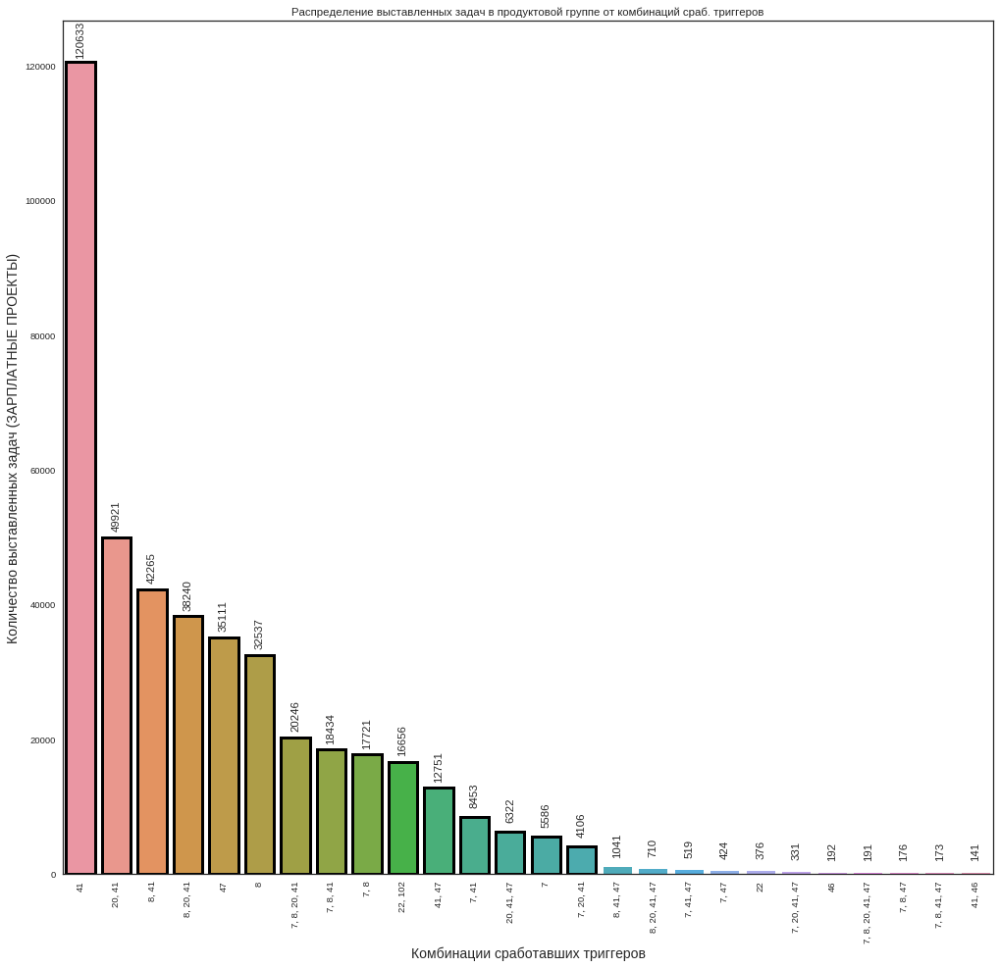

In [48]:
fig=plt.figure(figsize=(17,16))
ax=sns.barplot(x='list_trg', 
               y='total',
               data=convert_df[convert_df.total>np.round(convert_df.total.max()*0.001)])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
for p in ax.patches:
    if np.round(p.get_height(), decimals=2) > np.round(convert_df.total.max()*0.02):
        p.set_edgecolor('k')
        p.set_linewidth(3)
    ax.annotate('%.0f' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
ax.set_ylabel('Количество выставленных задач ('+ prod_gr_name +')', fontsize=14)
plt.title('Распределение выставленных задач в продуктовой группе от комбинаций сраб. триггеров')
fig.savefig(get_path('fig', 't_total_count_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
            format='png', 
            dpi=400, 
            bbox_inches='tight',
            pad_inches=0.1)

## Calculate deals convertation

In [49]:
dict_trg_pairs_d=new_df_d[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')

#### convertation based on deals basket

In [35]:
bins=1000
windowing_list=[]
thresholding=np.arange( np.int(new_df_d.trg_pair_id.min()), np.int(new_df_d.trg_pair_id.max()) )

for i in tqdm(np.arange(len(thresholding))):
    len_gr=len(new_df_d[(new_df_d.trg_pair_id == thresholding[i] )])
    if (len_gr !=0):
        part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) &
                       (new_df_d.trg_pair_id == thresholding[i] )]
        windowing_list.append((thresholding[i],len_gr,len(part_df)/len_gr*100.))

100%|██████████| 675/675 [00:00<00:00, 1523.43it/s]


#### convertation based on tasks basket

In [56]:
bins=1000
windowing_list=[]
thresholding=np.arange( np.int(new_df_d.trg_pair_id.min()), np.int(new_df_d.trg_pair_id.max()) )


for i in tqdm(np.arange(len(thresholding))):
    len_gr=len(new_df_d[(new_df_d.trg_pair_id == thresholding[i] )])
    len_gr_t=len(new_df_t[(new_df_t.trg_pair_id == thresholding[i])])
    if (len_gr !=0):
        part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) &
                         (new_df_d.trg_pair_id == thresholding[i])]
        windowing_list.append((thresholding[i],len_gr,len_gr_t,len(part_df)/len_gr_t*100.))

100%|██████████| 675/675 [00:01<00:00, 422.41it/s]


In [61]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','total_d','total_t','convertation'])
convert_df['list_trg']=convert_df.thresholding.map(dict_trg_pairs_d['list_trgs'])
convert_df.sort_values(by=['total_d'],ascending=False, inplace=True)
convert_df

,thresholding,total_d,total_t,convertation,list_trg
6,725,4808,120633,2.031782,41
1,284,4464,49921,4.495102,"20, 41"
30,901,4374,38240,6.950837,"8, 20, 41"
34,945,3464,42265,4.807761,"8, 41"
10,741,2926,35111,4.989889,47
27,850,2642,32537,5.353905,8
21,836,2528,20246,7.764497,"7, 8, 20, 41"
19,834,1718,17721,5.812313,"7, 8"
23,838,1659,18434,5.175220,"7, 8, 41"
8,729,1272,12751,5.458395,"41, 47"


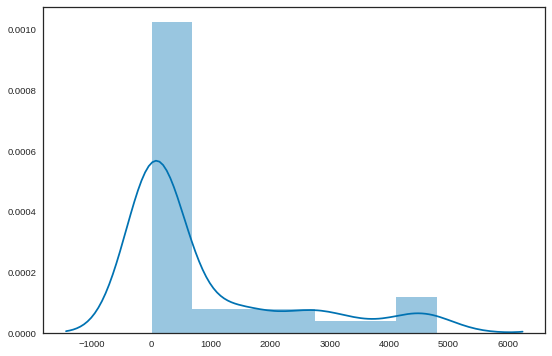

In [63]:
ser_to_plot=convert_df[['total_d','list_trg']].set_index('list_trg')
fig=plt.figure(figsize=(9,6))
ax=sns.distplot(a=ser_to_plot, norm_hist=True, kde=True)
#ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

### calculate deals distibution

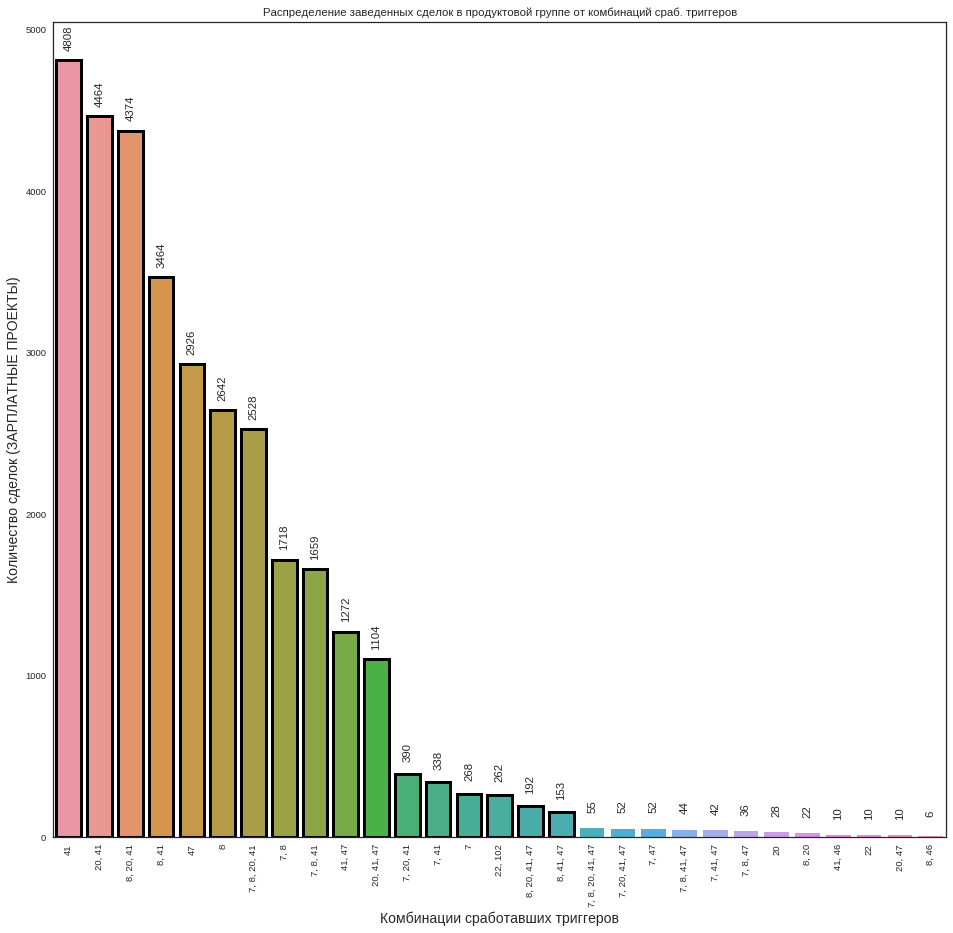

In [64]:
fig=plt.figure(figsize=(16,15))
ax=sns.barplot(x='list_trg', 
               y='total_d',
               data=convert_df[convert_df.total_d>np.round(convert_df.total_d.max()*0.001)])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
for p in ax.patches:
    if np.round(p.get_height(), decimals=2) > np.round(convert_df.total_d.max()*0.02):
        p.set_edgecolor('k')
        p.set_linewidth(3)
    ax.annotate('%.0f' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
ax.set_ylabel('Количество сделок ('+ prod_gr_name +')', fontsize=14)
plt.title('Распределение заведенных сделок в продуктовой группе от комбинаций сраб. триггеров')
fig.savefig(get_path('fig', 'd_total_count_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
            format='png', 
            dpi=400, 
            bbox_inches='tight',
            pad_inches=0.1)

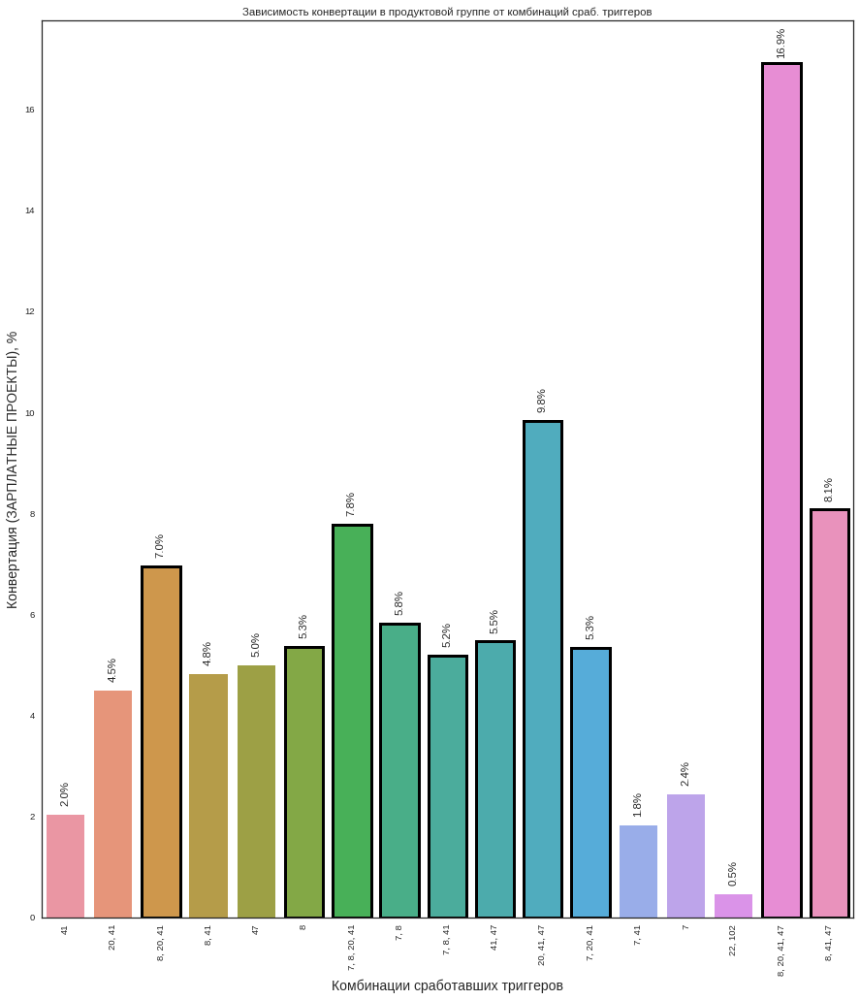

In [67]:
fig=plt.figure(figsize=(15,17))
ax=sns.barplot(x='list_trg', 
               y='convertation',
               data=convert_df[convert_df.total_d>np.round(convert_df.total_d.max()*0.02)])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
for p in ax.patches:
    if np.round(p.get_height(), decimals=2) > 5.:
        p.set_edgecolor('k')
        p.set_linewidth(3)
    ax.annotate('%.1f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                va='center', xytext=(0, 22), rotation=90, textcoords='offset points')
ax.set_xlabel('Комбинации сработавших триггеров', fontsize=14)
ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
plt.title('Зависимость конвертации в продуктовой группе от комбинаций сраб. триггеров');
#plt.legend(loc=9)

#fig.savefig(get_path('fig', 'conv_vs_trg_comb_'+prod_gr_name.lower()+'_.png'), 
#            format='png', 
#            dpi=400, 
#            bbox_inches='tight',
#            pad_inches=0.1)

### Calculate windowing convertation depending on the pairs of responded triggers

In [342]:
dict_trg_pairs=new_df[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')

In [343]:
bins=1000
windowing_list=[]
thresholding=np.arange( np.int(new_df.trg_pair_id.min()), np.int(new_df.trg_pair_id.max()) )

for i in tqdm(np.arange(len(thresholding))):
    part_df=new_df[( (new_df.amount_complete>0) | (new_df.flag_deal_completed>0) ) &
                   (new_df.trg_pair_id <= thresholding[i] )]
    windowing_list.append((thresholding[i],len(part_df)/len(new_df)*100.))

100%|███████████████████████████████████████| 243/243 [00:01<00:00, 170.48it/s]


In [344]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])
convert_df['list_trg']=convert_df.thresholding.map(dict_trg_pairs['list_trgs'])
convert_df=convert_df[~convert_df.list_trg.isnull()]
convert_df

,thresholding,convertation,list_trg
0,1,1.360307,1
1,2,2.476456,"1, 107"
2,3,2.685734,"1, 38"
3,4,3.156610,"1, 38, 107"
6,7,10.481339,107
7,8,10.481339,"107, 108"
8,9,10.498779,108
12,13,10.498779,"11, 12, 24"
16,17,10.516219,"11, 24"
23,24,10.533659,"12, 24, 25"


In [345]:
x=convert_df.thresholding, 
y=convert_df.convertation

In [346]:
logx=np.log(x)
logy=np.log(y)
xx=np.linspace(convert_df.thresholding.min(),convert_df.thresholding.max(),5)
logxx=np.log(xx)

out=linregress(logx,logy)

In [347]:
def reg_exp_func(x,k,b):
    a=np.exp(b)
    c=k*np.log(x)/x
    return a*np.exp(c*x)

In [348]:
trace0=go.Scatter(x=convert_df.thresholding, 
                  y=convert_df.convertation, 
                  mode='markers', 
                  marker=dict(size=7, color='blue'), 
                  name='data')

trace1=go.Scatter(x=xx, 
                  y= reg_exp_func(xx,out.slope,out.intercept), 
                  mode='lines', 
                  name='exp_regres')

layout=go.Layout(
                  autosize=False,
                  width=1000,
                  height=800,
                  xaxis=dict(
                      title='<b>ID Комбинации сраб. триггеров</b>',
                      titlefont=dict(family='Courier New, monospace', size=16),
                      tickmode='array',
                      ticks='outside',
                      #tickvals=[x for (i,x) in enumerate(list(convert_df.thresholding)) if i % 2 == 0],
                      #ticktext=[x for (i,x) in enumerate(list(convert_df.thresholding.map(dict_trg_pairs['list_trgs']))) if i % 2 == 0],
                      tickvals=[x for (i,x) in enumerate(list(convert_df.thresholding)) if i % 3 == 0],
                      ticktext=[x for (i,x) in enumerate(list(convert_df.list_trg)) if i % 3 == 0],
                      #tick0=1,
                      #dtick=2,
                      ticklen=3,
                      tickwidth=4,
                      tickcolor='red'
                  ),
                  yaxis=dict(
                      title='<b>Конвертация('+prod_gr_name+'), %',
                      titlefont=dict(family='Courier New, monospace', size=16),
                  ),
                  margin=dict(b=150, pad=1)                   
                )
data=[trace0,trace1]
fig=go.Figure(data=data, layout=layout)
iplot(fig, filename='data_plot')


### Calculate local convertation depending on the difference between date of deal's creation and the first date of triggering

#### automated converation calculation with the following plotting 

In [12]:
from IPython.display import clear_output

### plotting deals distribution normalized on task group

processing--> КРЕДИТОВАНИЕ


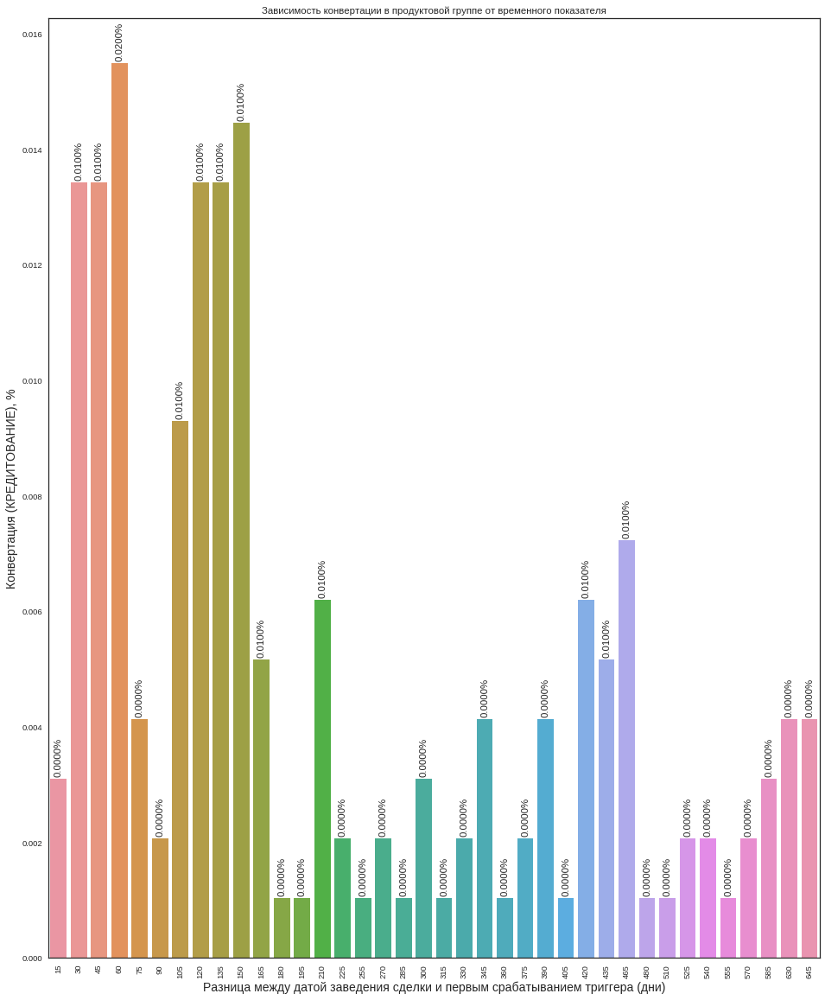

In [16]:
        prod_gr_name='КРЕДИТОВАНИЕ'

        print('processing--> '+prod_gr_name)
        
        new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]
        new_df_d=df[df['prod_gr_atb_seg']==prod_gr_name]

        dict_trg_pairs_d=new_df_d[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')

        windowing_list=[]
        thresholding=np.array(new_df_d.diff_days.value_counts().index.tolist())
        thresholding=thresholding[thresholding>0]
        
        len_gr_t=len(new_df_t)
        
        for i in (np.arange(len(thresholding))):
            len_gr=len(new_df_d[(new_df_d.diff_days == thresholding[i])])
            #len_gr_t=len(new_df_t[(new_df_t.diff_days <= thresholding[i])])
            if len_gr!=0:
                part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) & 
                               (new_df_d.diff_days == thresholding[i] )]
                windowing_list.append((thresholding[i],len(part_df)/len_gr_t*100.)) 

        convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])

        if len(convert_df)!=0:

            fig=plt.figure(figsize=(16,20))
            ax=sns.barplot(x='thresholding', 
                           y='convertation',
                           data=convert_df[(convert_df.convertation>0)&(convert_df.thresholding % 15 == 0)])
            ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
            for p in ax.patches:
                
                if np.round(p.get_height(), decimals=2) > 70.:
                    p.set_edgecolor('k')
                    p.set_linewidth(3) 
                
                ax.annotate('%.4f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                            va='center', xytext=(0, 25), rotation=90, textcoords='offset points')
            ax.set_xlabel('Разница между датой заведения сделки и первым срабатыванием триггера (дни)', fontsize=14)
            ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
            plt.title('Зависимость конвертации в продуктовой группе от временного показателя');

            #plt.legend(loc=9)
            
            fig.savefig(get_path('fig', '2_norm_conv_vs_diff_'+prod_gr_name.lower()+'_.png'), 
                        format='png', 
                        dpi=400, 
                        bbox_inches='tight',
                        pad_inches=0.1)           

### plotting deals distribution normalized on relevant deals group

In [163]:
bins=1000
for i in tqdm(range(len(lst_prod_grs))):
    
    #if i>=lst_prod_grs.index('ВЕКСЕЛЯ'):
    
        prod_gr_name=lst_prod_grs[i]
        
        if prod_gr_name in lst_prod_grs_d:
            
            print('processing--> '+prod_gr_name)

            #new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]
            new_df_d=df[df['prod_gr_atb_seg']==prod_gr_name]

            dict_trg_pairs_d=new_df_d[['trg_pair_id','list_trgs']].set_index('trg_pair_id').to_dict(orient='dict')

            windowing_list=[]
            thresholding=np.array(new_df_d.diff_days.value_counts().index.tolist())
            thresholding=thresholding[thresholding>0]
            for i in (np.arange(len(thresholding))):
                len_gr=len(new_df_d[(new_df_d.diff_days == thresholding[i])])
                #len_gr_t=len(new_df_t[(new_df_t.diff_days < thresholding[i])])
                if len_gr_t!=0:
                    part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) & 
                                     (new_df_d.diff_days == thresholding[i] )]
                    windowing_list.append((thresholding[i],len(part_df)/len_gr*100.)) 

            convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])

            if len(convert_df)!=0:

                fig=plt.figure(figsize=(15,20))
                ax=sns.barplot(x='thresholding', 
                               y='convertation',
                               data=convert_df[(convert_df.convertation>0)&(convert_df.thresholding % 15 == 0)])
                ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
                for p in ax.patches:

                    if np.round(p.get_height(), decimals=2) > 70.:
                        p.set_edgecolor('k')
                        p.set_linewidth(3) 

                    ax.annotate('%.1f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                                va='center', xytext=(0, 25), rotation=90, textcoords='offset points')
                ax.set_xlabel('Разница между датой заведения сделки и первым срабатыванием триггера (дни)', fontsize=14)
                ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
                plt.title('Зависимость конвертации в продуктовой группе от временного показателя');

                plt.legend(loc=9)        

                fig.savefig(get_path('fig', 'conv_vs_days_between_'+prod_gr_name.lower()+'_.png'), 
                            format='png', 
                            dpi=300, 
                            bbox_inches='tight',
                            pad_inches=0.1)

                clear_output()
                plt.close(fig)    


100%|██████████| 16/16 [00:03<00:00,  1.48it/s]


#### manual calculations and selective plotting

In [351]:
bins=1000
windowing_list=[]
thresholding=np.arange(np.int(new_df.diff_days.min()), np.int(new_df.diff_days.max()))
thresholding=thresholding[thresholding>0]
for i in tqdm(np.arange(len(thresholding))):
    len_gr=len(new_df[(new_df.diff_days == thresholding[i])])
    if len_gr!=0:
        part_df=new_df[( (new_df.amount_complete>0) | (new_df.flag_deal_completed>0) ) & 
                     (new_df.diff_days == thresholding[i] )]
        windowing_list.append((thresholding[i],len(part_df)/len_gr*100.))

100%|███████████████████████████████████████| 671/671 [00:02<00:00, 266.02it/s]


In [352]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])
convert_df

,thresholding,convertation
0,2,50.000000
1,3,50.000000
2,4,100.000000
3,6,40.000000
4,7,42.857143
5,8,42.857143
6,9,22.222222
7,10,25.000000
8,11,14.285714
9,13,80.000000


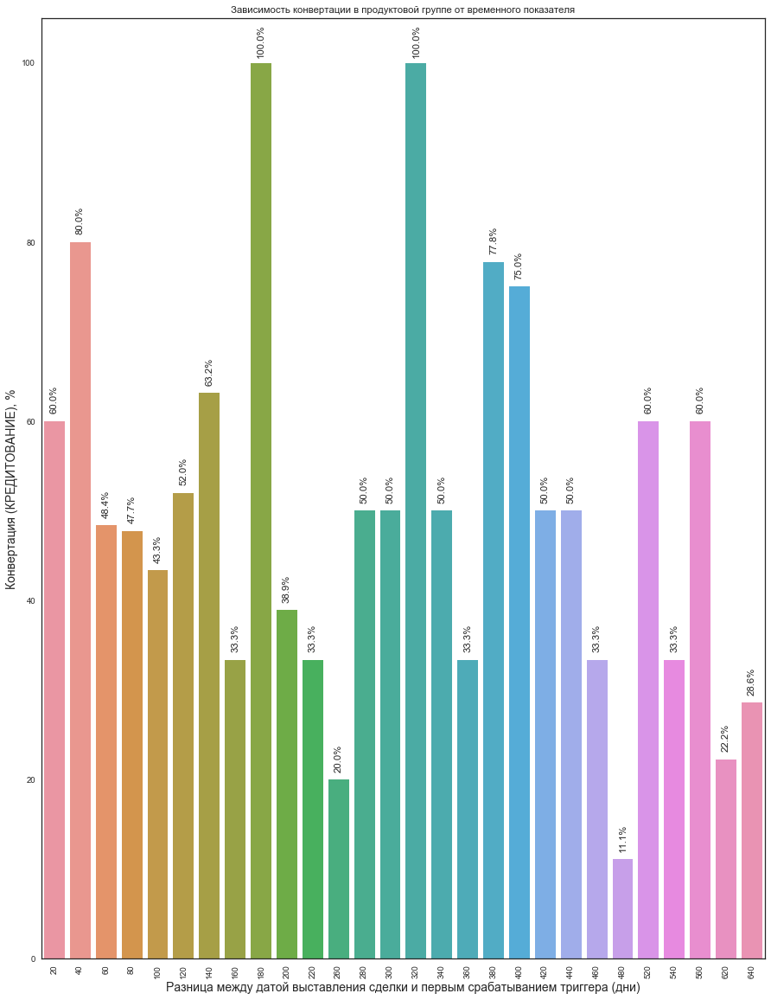

In [362]:
fig=plt.figure(figsize=(15,20))
ax=sns.barplot(x='thresholding', 
               y='convertation',
               data=convert_df[(convert_df.convertation>0)&(convert_df.thresholding % 20 ==0)])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
for p in ax.patches:
    ax.annotate('%.1f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                va='center', xytext=(0, 25), rotation=90, textcoords='offset points')
ax.set_xlabel('Разница между датой выставления сделки и первым срабатыванием триггера (дни)', fontsize=14)
ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
plt.title('Зависимость конвертации в продуктовой группе от временного показателя');

plt.legend(loc=9)

# Calculate local convertation depending on the number of responded triggers 

### automated calculations over list of product groups


  0%|          | 0/16 [00:00<?, ?it/s]

processing--> ЗАРПЛАТНЫЕ ПРОЕКТЫ




  6%|▋         | 1/16 [00:57<14:24, 57.65s/it][A

processing--> ЛИЗИНГ



 12%|█▎        | 2/16 [01:16<10:42, 45.93s/it]

processing--> КРЕДИТОВАНИЕ



 19%|█▉        | 3/16 [01:35<08:11, 37.80s/it][A

processing--> ЭКВАЙРИНГ



 25%|██▌       | 4/16 [01:49<06:10, 30.88s/it][A

processing--> БАНКОВСКАЯ ГАРАНТИЯ



 31%|███▏      | 5/16 [02:01<04:37, 25.22s/it][A

processing--> БИЗНЕС-КАРТА



 38%|███▊      | 6/16 [02:06<03:11, 19.10s/it]

processing--> СТРАХОВАНИЕ



 44%|████▍     | 7/16 [02:10<02:11, 14.57s/it]

processing--> ДИСТАНЦИОННОЕ ОБСЛУЖИВАНИЕ



 50%|█████     | 8/16 [02:13<01:29, 11.13s/it]

processing--> ПРОДУКТЫ ПРИВЛЕЧЕНИЯ СРЕДСТВ



 56%|█████▋    | 9/16 [02:16<01:01,  8.75s/it]

processing--> ИНКАССАЦИЯ



 62%|██████▎   | 10/16 [02:19<00:41,  6.92s/it][A

processing--> КОМПЛЕКСНОЕ СТРАХОВАНИЕ БИЗНЕСА



 69%|██████▉   | 11/16 [02:22<00:27,  5.59s/it][A

processing--> КОНВЕРСИОННЫЕ ОПЕРАЦИИ



 75%|███████▌  | 12/16 [02:24<00:18,  4.57s/it][A

processing--> CASH MANAGEMENT



 81%|████████▏ | 13/16 [02:26<00:11,  3.86s/it][A

processing--> ВЕКСЕЛЯ



 94%|█████████▍| 15/16 [02:28<00:03,  3.01s/it][A

processing--> ВАЛЮТНЫЙ КОНТРОЛЬ



100%|██████████| 16/16 [02:30<00:00,  2.73s/it][A


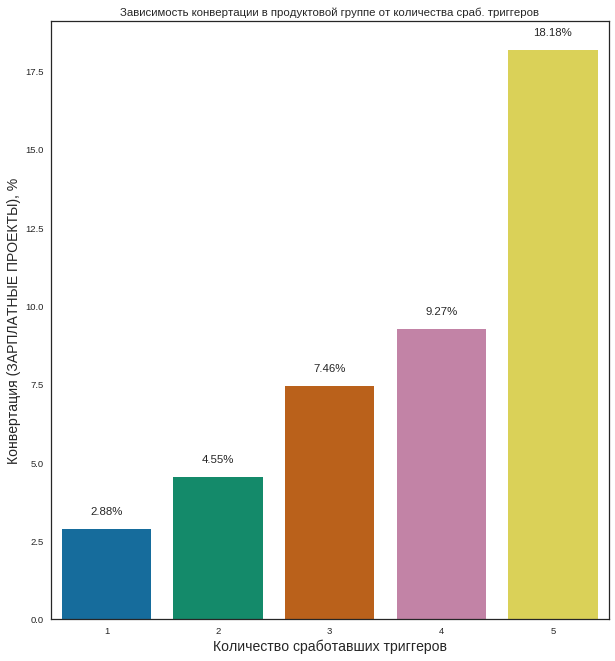

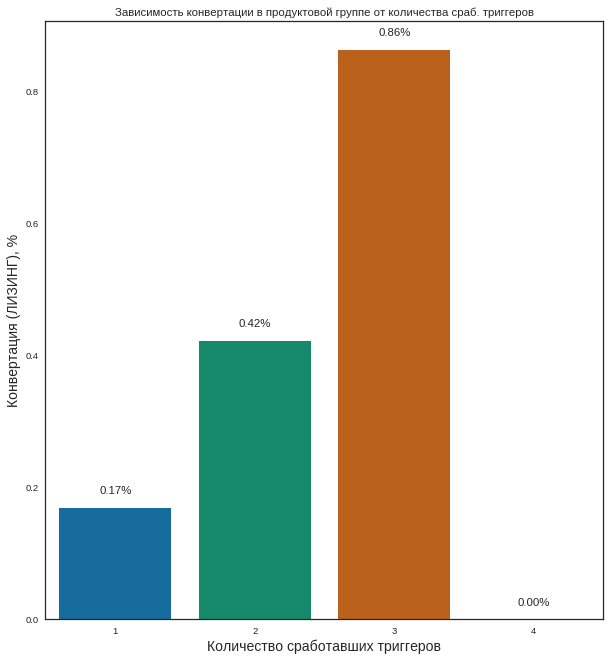

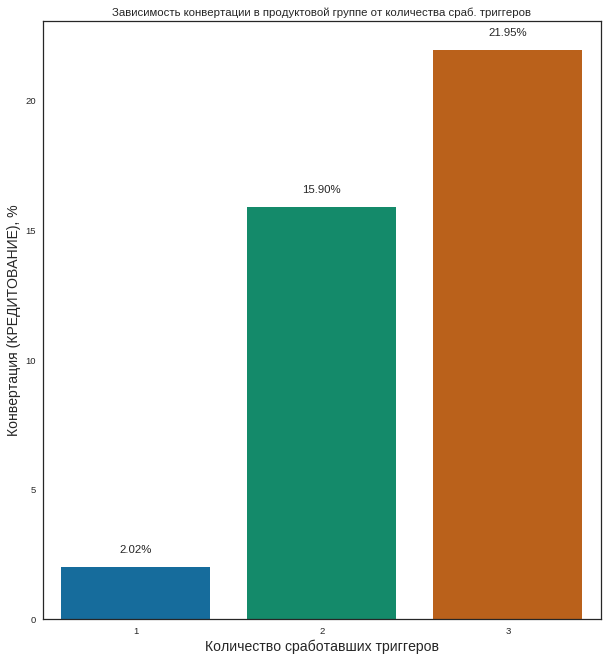

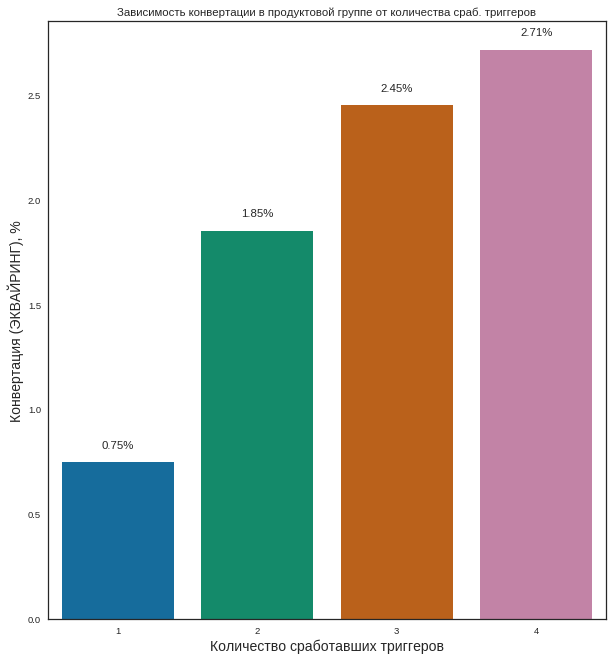

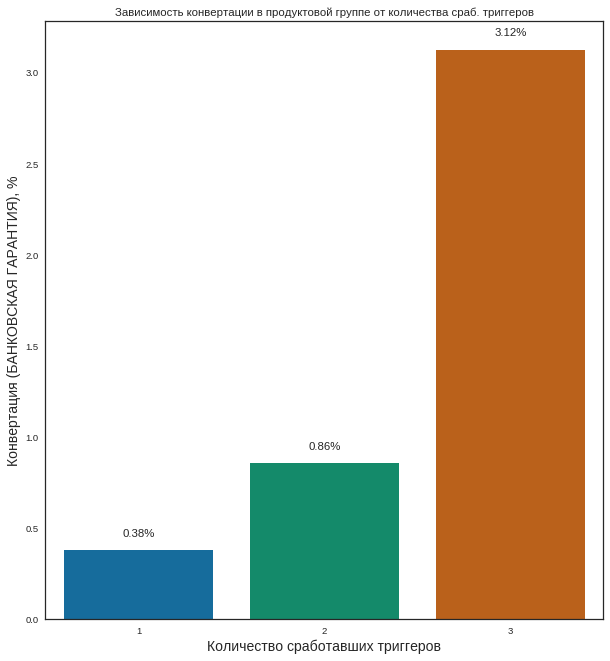

...

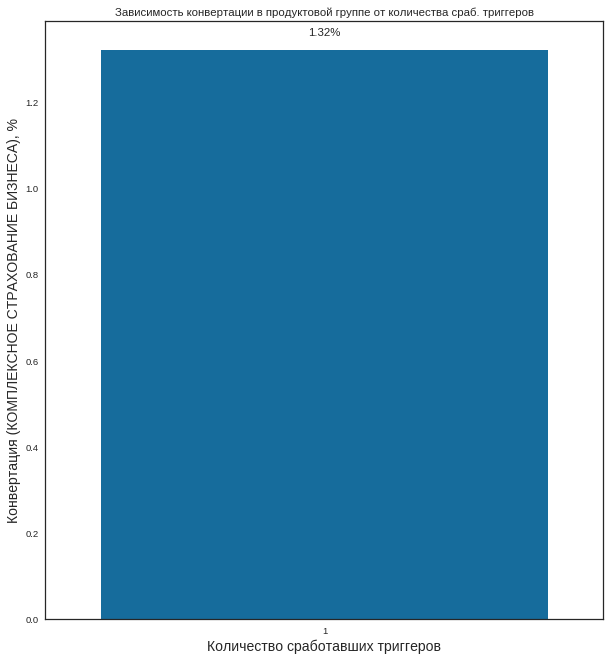

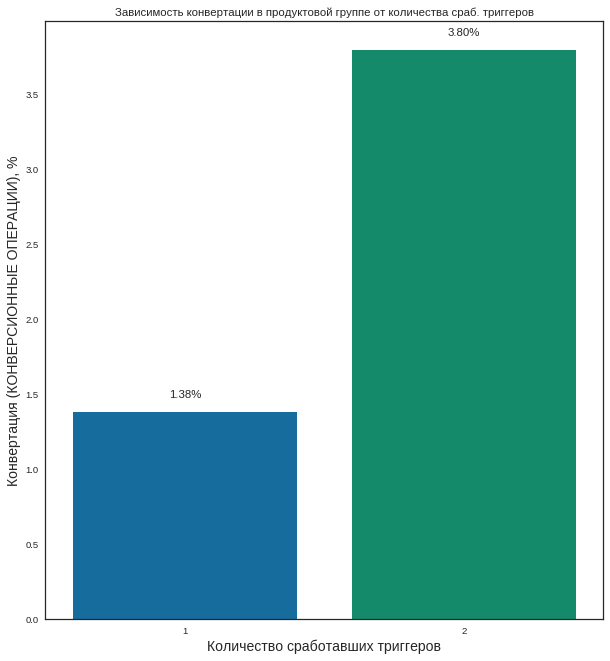

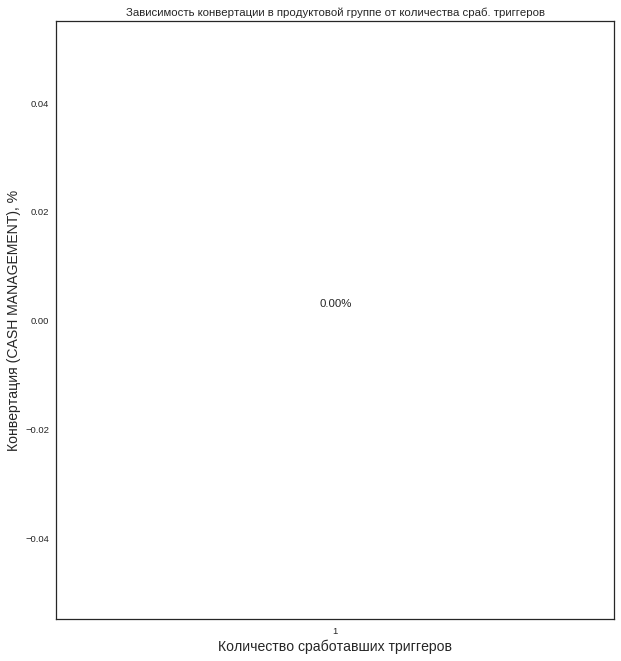

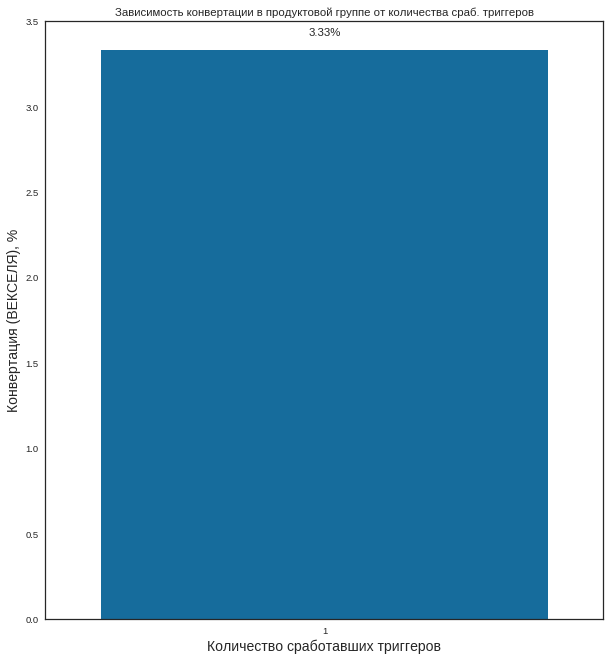

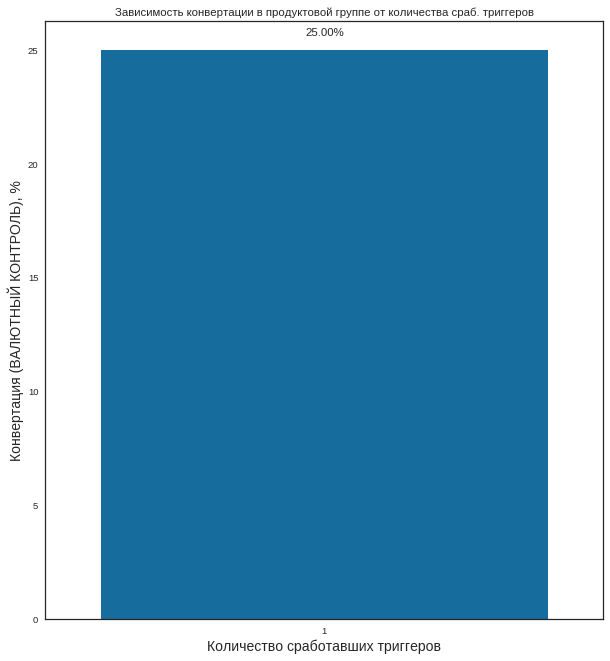

In [30]:
bins=1000
for i in tqdm(range(len(lst_prod_grs))):
    
    prod_gr_name=lst_prod_grs[i]

    if prod_gr_name in lst_prod_grs_d:

        print('processing--> '+prod_gr_name)

        new_df_t=df_t[df_t['prod_gr_atb_seg']==prod_gr_name]
        new_df_d=df[df['prod_gr_atb_seg']    ==prod_gr_name]

        # rank deals datamart by task_id
        new_df_d['trg_count'] = (new_df_d.groupby('task_id')
                                         .task_id
                                         .rank(pct=False,
                                                method='max', 
                                                ascending=True))
        new_df_d['trg_count'] = new_df_d['trg_count'].astype(int)

        # rank task datamart by task_prpr_all
        new_df_t['trg_count'] = (new_df_t.groupby('task_prpr_all')
                                         .task_prpr_all
                                         .rank(pct=False,
                                                method='max', 
                                                ascending=True))
        new_df_t['trg_count'] = new_df_t['trg_count'].astype(int)

        # calculate converation
        windowing_list=[]
        thresholding=np.array(new_df_d.trg_count.value_counts(sort=False).index.tolist())

        for i in tqdm(np.arange(len(thresholding))):
            #len_gr=len(new_df[(new_df.trg_count == thresholding[i])])
            len_gr_t=len(new_df_t[(new_df_t.trg_count == thresholding[i])])
            part_df=new_df_d[( (new_df_d.amount_complete>0) | (new_df_d.flag_deal_completed>0) ) & 
                             (new_df_d.trg_count == thresholding[i])]
            windowing_list.append((thresholding[i],len(part_df)/len_gr_t*100.))


        convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])

        fig=plt.figure(figsize=(10,11))
        ax=sns.barplot(x='thresholding', 
                       y='convertation',
                       data=convert_df)
        #ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
        for p in ax.patches:
            ax.annotate('%.2f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                        va='center', xytext=(0, 17), rotation=0, textcoords='offset points')
        ax.set_xlabel('Количество сработавших триггеров', fontsize=14)
        ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
        plt.title('Зависимость конвертации в продуктовой группе от количества сраб. триггеров');

        fig.savefig(get_path('fig', 'd_conv_vs_trg_count_'+prod_gr_name.lower()+'_.png'), 
                    format='png', 
                    dpi=400, 
                    bbox_inches='tight',
                    pad_inches=0.1)    
        

### manual testing

In [23]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])
convert_df

,thresholding,convertation
0,3,4.552481
1,2,2.880135
2,4,7.463924
3,5,9.274194
4,6,18.181818


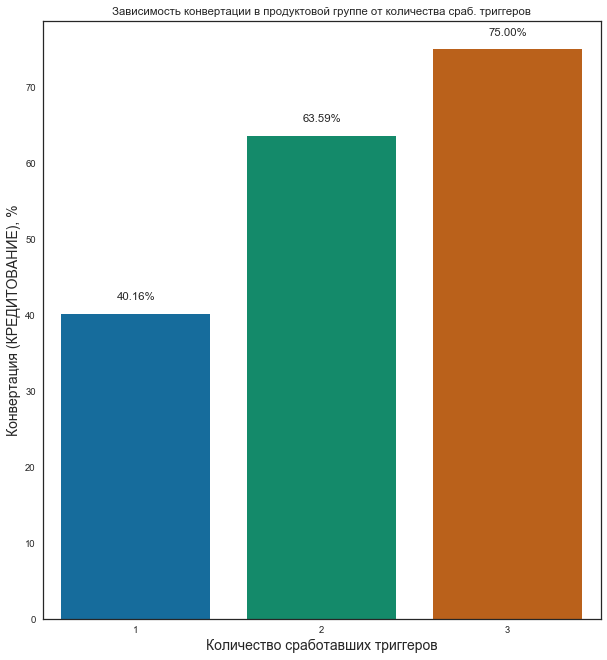

In [229]:
fig=plt.figure(figsize=(10,11))
ax=sns.barplot(x='thresholding', 
               y='convertation',
               data=convert_df)
#ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
for p in ax.patches:
    ax.annotate('%.2f%%' % np.round(p.get_height(), decimals=2), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center',
                va='center', xytext=(0, 17), rotation=0, textcoords='offset points')
ax.set_xlabel('Количество сработавших триггеров', fontsize=14)
ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
plt.title('Зависимость конвертации в продуктовой группе от количества сраб. триггеров');

plt.legend(loc=9)

### calculate windowing convertation depending on the number of responded triggers 

In [33]:
bins=1000
windowing_list=[]
thresholding=np.arange(np.int(trg_df.trg_count.max()))

for i in tqdm(np.arange(len(thresholding))):
    part_df=new_df[( (new_df.amount_complete>0) | (new_df.flag_deal_completed>0) ) & 
                 (new_df.trg_count <= thresholding[i]+1 )]
    windowing_list.append((thresholding[i]+1,len(part_df)/len(new_df)*100.))

100%|████████████████████████████████████████████| 3/3 [00:00<00:00, 37.50it/s]


In [280]:
convert_df=pd.DataFrame(data=windowing_list,columns=['thresholding','convertation'])

In [281]:
convert_df

,thresholding,convertation
0,1,29.113924
1,2,37.919648
2,3,43.368189
3,4,44.909191


In [282]:
convert_df.corr()

,thresholding,convertation
thresholding,1.000000,0.955794
convertation,0.955794,1.000000


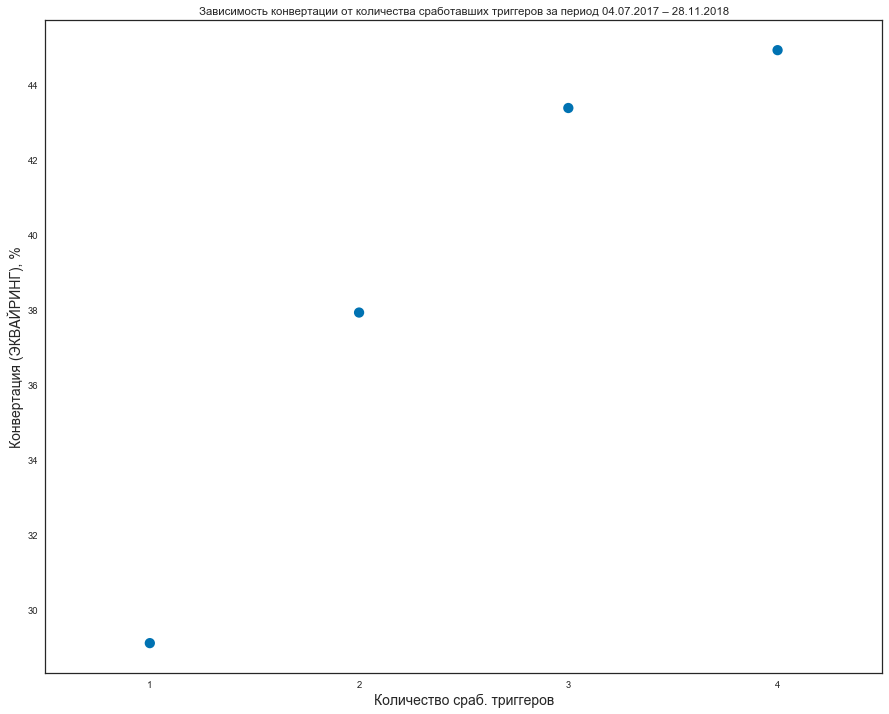

In [116]:
fig,ax=plt.subplots()
ax=sns.pointplot(  x='thresholding',  
                   y='convertation', 
                   data=convert_df[convert_df.thresholding!=0],
                   join=False )
ax.set_xlabel('Количество сраб. триггеров', fontsize=14)
ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)
plt.title('Зависимость конвертации от количества сработавших триггеров за период 04.07.2017 – 28.11.2018');
fig.savefig(get_path('fig', 'conv_vs_trg_count_'+prod_gr_name.lower()+'_.png'), 
            format='png', 
            dpi=500, 
            bbox_inches='tight',
            pad_inches=0.1)

#ax.set_ylim(bottom=33, top=44)
#ax.set_xlim(left=0, right=4)
#ax.tick_params(axis='x',which='minor',length=0,labelbottom=False)
#ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.0f'))
#ax.xaxis.set_minor_formatter(plt.NullFormatter())
#ax.xaxis.set_minor_locator(tk.AutoMinorLocator(1))
#plt.setp(ax.get_xticklabels(minor=False),visible=True)

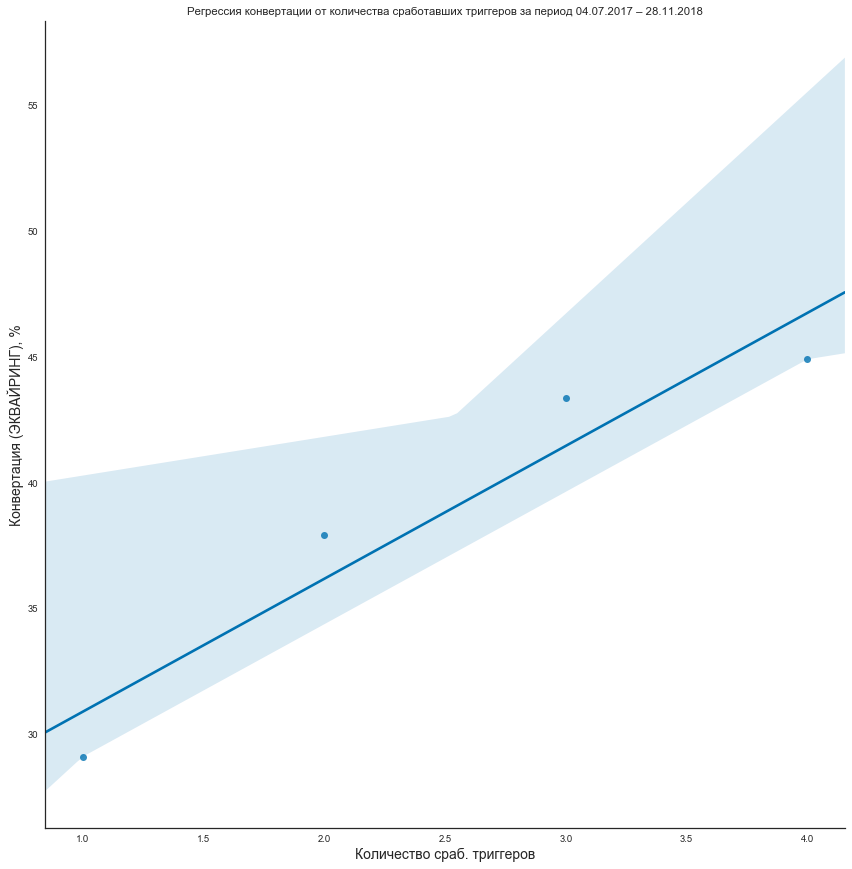

In [154]:
pr=sns.pairplot(x_vars='thresholding',  
                y_vars='convertation', 
                data=convert_df,
                kind='reg',
                size=12.)
#ax.set_ylim(bottom=33, top=44)
#ax.tick_params(axis='x',which='minor',labelbottom=False)
plt.title('Регрессия конвертации от количества сработавших триггеров за период 04.07.2017 – 28.11.2018');
for ax in pr.axes.flat:
    #ax.tick_params(axis='x',which='minor',labelbottom=False)
    #ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.0f'))
    #ax.xaxis.set_minor_formatter(plt.NullFormatter())
    ax.set_xlabel('Количество сраб. триггеров', fontsize=14)
    ax.set_ylabel('Конвертация ('+ prod_gr_name +'), %', fontsize=14)

    ax.figure.savefig( get_path('fig', 'conv_vs_trg_count_'+prod_gr_name.lower()+'_reg.png'), 
                format='png', 
                dpi=500, 
                bbox_inches='tight',
                pad_inches=0.1)

In [38]:
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
import plotly.plotly as py
import plotly.graph_objs as go
from matplotlib import pylab
from scipy.optimize import curve_fit
from scipy.stats import linregress
from sklearn import linear_model 

In [39]:
init_notebook_mode()

In [283]:
x=convert_df.thresholding.values.astype(float)
y=convert_df.convertation.values

In [284]:
xlim=len(convert_df)

In [285]:
logx=np.log(x)
logy=np.log(y)
xx=np.linspace(1,xlim,20)
logxx=np.log(np.linspace(1,xlim,20))

out=linregress(logx,logy)

In [286]:
def reg_exp_func(x,k,b):
    a=np.exp(b)
    c=k*np.log(x)/x
    return a*np.exp(c*x)

In [301]:
def exp_func(x,a,b):
    return a*(1. - np.exp(-b*(x**0.9) ))

In [302]:
popt, pcov = curve_fit(exp_func,x,y,
                       p0=[1e-2]*2, 
                       bounds=(1e-2, [70,60]),
                       method='trf')

xx=np.linspace(1,xlim,20)
yy=exp_func(xx,*popt)


coef=np.polyfit(x,y,deg=4)
xx=np.linspace(1,xlim,20)
yval=np.polyval(coef,xx)


trace0=go.Scatter(x=x, y=y, mode='markers', marker=dict(size=7, color='blue'), name='data')
trace1=go.Scatter(x=xx, y=yy, mode='lines', name='Sigmoid_optim')
trace2=go.Scatter(x=xx, y=yval, mode='lines', name='poly')
trace3=go.Scatter(x=xx, y= reg_exp_func(xx,out.slope,out.intercept), mode='lines', name='exp_regres')

layout=go.Layout(
                  xaxis=dict(
                      title='Количество триггеров',
                      titlefont=dict(family='Courier New, monospace', size=13),
                      tickmode='linear',
                      ticks='outside',
                      tick0=1,
                      dtick=1,
                      ticklen=8,
                      tickwidth=4,
                      tickcolor='red'
                  ),
                  yaxis=dict(
                      title='Конвертация ('+prod_gr_name+'), %',
                      titlefont=dict(family='Courier New, monospace', size=13),
                  )
                )
data=[trace0,trace1,trace2]
fig=go.Figure(data=data, layout=layout)
iplot(fig, filename='approx_comp')


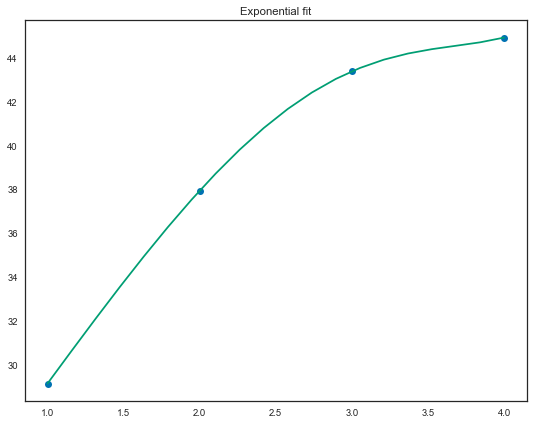

In [253]:
plt.figure(figsize=(9,7))
coef=np.polyfit(x,y,deg=7)
xx=np.linspace(1,4,20)
yval=np.polyval(coef,xx)
plt.plot(x,y,'o',xx,yval)
pylab.title('Exponential fit')